# Regression Analyses (work in progress--much more documentation to come)

Descriptive statistics, which Python for Nonprofits has focused on so far, are immensely valuable. Averages, means, medians, and totals are well-known, easy-to-interpret measures that provide crucial information about how organizations are performing.

However, depending on your work, you may need to venture into the world of *inferential* statistics from time to time. In this world, you aren't simply reporting on differences in mean values between two or more groups: you're also making an *inference* about the nature of the distributions of those groups' values. (For more on statistical inference, consult https://en.wikipedia.org/wiki/Statistical_inference ).

An example should make this clearer. Suppose NVCU's bookstore management is looking into differences in average fall semester sales among colleges. The bookstore's leaders notice that the highest-ranking college by fall sales was STB, with an average of 80.28 in spending per student; meanwhile, the lowest-ranking college was STL, whose students averaged 79.69 in bookstore spending.

It's accurate to report, from a descrptive statistics perspective, that "STL students spent less at the bookstore, on average, than did STB students last fall." However, does this mean that NVCU should make a concerted marketing effort to raise sales at STL? Not necessarily--STL's average spending was only 0.73% less than was STB's. But what if the difference was 2%? Or 5%? At what point would we want to address apparent flagging bookstore sales at one of our colleges?

This is where inferential statistics--such as the regression models I'll focus on in this section--can prove very helpful. From an inferential stats standpoint, we can look beyond mere differences in means and instead ask: "What is the likelihood that, if STB and STL students actually have the same spending patterns, we would have seen a difference of this magnitude in average sales?" If the likelihood is small enough--say, less than 5%--we might choose to conclude that there is a significant difference between STB and STL sales. From a business perspective, we might then decide to take some concrete action to address this difference, such as advertisisng the bookstore more heavily within STL's dorms. (Note: for more information on what p values do (and do not) mean, see https://ethanweed.github.io/pythonbook/04.04-hypothesis-testing.html#the-p-value-of-a-test . 

## An introduction to regressions

Regression models allow us to examine how one or more independent variables relates to a particular dependent variable. (See https://en.wikipedia.org/wiki/Linear_regression for more details.) They also allow us to 'control' for various factors in order to better assess whether another variable had a significant relationship with a given outcome. Their flexibility, intuitiveness, and practicality make them an excellent tool to have in your statistics arsenal. 

In this section, we'll first use regression models to determine how college, gender, level, and fall bookstore spending can help predict spring spending. Next, we'll create additional models that use American Community Survey data to evaluate the relationship between different education levels--and the percentage of regions that have a bachelor's degree--on median incomes. 

There will be plenty of visualizations along the way, as plotting data can help prevent us from misinterpreting it--or from applying regression models incorrectly. (For a classic example of the importance of visualization, see https://en.wikipedia.org/wiki/Anscombe's_quartet . For an even better example, see https://en.wikipedia.org/wiki/Datasaurus_dozen)

## Important caveats

This notebook is meant to serve as a *simplified* introduction to regression analyses in Python. Its aim is merely to show you how to use the Statsmodels library to run regressions and interpret key parts of the output; it's certainly *not* meant to be the definitive resource on regression analyses or inferential statistics. If you're new to the concept of regressions, or need a refresher on the theory underlying them, you'll also want to review a more comprehensive guide.

### 1. Regression assumptions

This notebook does *not* provide detailed coverage of the assumptions that regression models make. Thus, before you begin using regressions for real-world analyses, you would do well to review those assumptions (as your model may not be valid if these assumptions do not hold). In addition, you should not assume that the models shown within this chapter satisfy all of these assumptions.

For more information about these assumptions, I recommend reading the 'Model checking' section within *Learning Statistics with Python's* 'Linear Regression' chapter, available at https://ethanweed.github.io/pythonbook/05.04-regression.html#model-checking. The rest of this chapter is a valuable resource in its own right. (Note: this chapter does contain some mild language.) 

Statsmodels offers plenty of tools for testing regression assumptions. You can learn more about these tools at https://www.statsmodels.org/dev/examples/notebooks/generated/regression_diagnostics.html
and https://www.statsmodels.org/stable/diagnostic.html .

### 2. Criticisms of the 'frequentist' model

In this section, we'll consider regression results to be statistically significant if they have a p-value below 0.05. However, you should take care not to over-rely on p-values when making decisions. (For more information about the limitations of p-values, see https://en.wikipedia.org/wiki/Misuse_of_p-values and https://theconversation.com/the-problem-with-p-values-how-significant-are-they-really-20029 ).

You may ultimately decide to forego frequentist statistics altogether for a given project and try a Bayesian approach instead; a free overview of Bayesian statistics in Python is available at https://allendowney.github.io/ThinkBayes2/ . 

### Unweighted data

This section does not demonstrate how to perform regressions on data that incorporate sampling weights (which is a common feature of survey data). Unfortunately, coverage for such regressions is very limited in Python. The Samplics library (https://samplics-org.github.io/samplics/) may offer support for weighted regressions in the near future, but as of January 2025, its regression code wasn't yet ready for use. (In the meantime, you may still find its chi-squared and t-tests to be useful tools.)

You can, however, do all sorts of weighted regression analyses in R. (For an excellent overview of such analyses, check out Exploring Complex Survey Data Analysis Using R--available at https://tidy-survey-r.github.io/tidy-survey-book/index.html ). If you'd like to incorporate R code for weighted survey analyses--or any other domain where R has more comprehensive tools--into your Python scripts, make sure to check out the Rpy2 library, which allows you to run R code directly within Python and to pass variables from Python to R (and back). For more details on applying Rpy2 within Juptyer notebooks, see https://rpy2.github.io/doc/latest/html/interactive.html .

I don't list these caveats in order to scare you: I merely want to characterize this chapter (like all of the other chapters of Python for Nonprofits, to be honest) as a *starting point* for further exploration, rather than a comprehensive guide.

Importing various libraries:

In [1]:
import pandas as pd
import math
import numpy as np
from sqlalchemy import create_engine
e = create_engine('sqlite:///../Appendix/nvcu_db.db')
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
import plotly.express as px
from statsmodels.stats.weightstats import ttest_ind

import sys
sys.path.insert(1, '../Appendix')
from helper_funcs import config_notebook, wadi
display_type = config_notebook(display_max_columns = 100,
                              display_max_rows = 8)
# display_max_colunms = 100

## Part 1: Analyzing bookstore sales

The management of NVCU's bookstore is analyzing fall and spring sales from the previous year. They were excited to learn that per-student spending increased by around $7 from the fall semester to the spring semester; however, they would also like you to help them analyze these changes in spending by various demographic criteria (specifically, gender, college, and level).

A few notable changes took place during the spring semester that the bookstore would like you to investigate further. First, due to pressure from a nutrition-focused professor, unhealthy snacks were removed from the checkout aisles. These snacks were especially popular among freshmen and sophomores, so the bookstore would like to determine whether their removal may have affected sales for younger students. 

Second, an intensive marketing campaign was carried out at STM and STL; if it ended up being successful, the bookstore will implement it at the other colleges also. (The bookstore's decision to launch this campaign at just two randomly-selected colleges not only saved money; it also gave its leaders a chance to assess, by comparing sales at the targeted schools with sales at the other schools, whether it had a positive impact. This is an example of an A/B test; for more details on this strategy, see https://en.wikipedia.org/wiki/A/B_testing .)

We'll begin our analyses here with some tried-and-true descriptive statistics and visualizations; these will show us how changes in sales differed for various groups of interest. Next, we'll implement a linear regression model so that we can make *inferences* about the meaning of these changes. By setting gender, college, level, and fall spending as our independent variables and spring spending as our dependent variable, we'll be able to assess whether these factors had a significant effect on students' spring purchasing behavior.

To prepare for these analyses, we'll first import our sales data from the NVCU database:

In [2]:
df_sales = pd.read_sql('select * from bookstore_sales', con = e)
df_sales

,student_id,gender,college,level,Fall,Spring,Fall_Spring_Change
0,2020-1,F,STC,Fr,66.80,43.20,-23.60
1,2020-2,F,STM,Fr,104.67,130.17,25.50
2,2020-3,F,STC,Fr,46.17,-8.95,-55.12
3,2020-4,F,STC,Fr,58.68,53.95,-4.73
...,...,...,...,...,...,...,...
16380,2023-5440,M,STM,Se,59.95,67.11,7.16
16381,2023-5441,M,STL,Se,71.57,65.04,-6.53
16382,2023-5442,M,STB,Se,100.52,61.14,-39.38
16383,2023-5443,M,STM,Se,57.45,62.86,5.41


### Descriptive statistics and visualizations

Before we set up our regression, we'll first use descriptive analyses and visualizations to get a better sense of our underlying data.

As noted above, the bookstore saw a significant increase in per-student sales from the fall to the spring:

In [3]:
df_sales[['Fall', 'Spring']].mean()

Fall      80.091662
Spring    86.842615
dtype: float64

We can gain a better sense of the relationship between fall and spring sales by plotting each set of sales within a scatter chart. Each dot in the following chart reflects a single student's fall and spring spending (shown within the x and y axes, respectively).

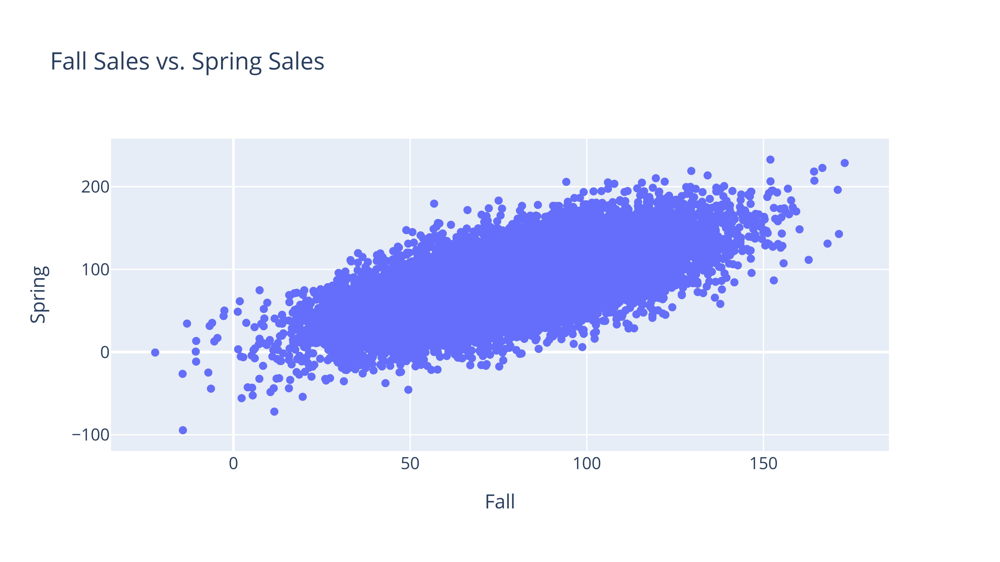

In [4]:
fig_fall_spring_sales_scatter = px.scatter(
    df_sales, x = 'Fall', y = 'Spring',
title = 'Fall Sales vs. Spring Sales')
wadi(fig_fall_spring_sales_scatter, 
     'Charts/fall_spring_sales_scatter', display_type = display_type)

The 'blob' of results slopes upward, indicating that students who spent more in the fall also tended to spend more in the spring. However, we can clearly observe a great deal of variation in spring spending among students with similar fall spending patterns. Some students who spent around 100 in the fall, for instance, went on to spend roughly 200 in the spring; other students with this fall spending total hardly spent anything at the bookstore during the spring semester.

Did these spending patterns vary by college and level, however? To investigate that question, we can first create a pivot table that determines mean changes in spending by these groups.

In [5]:
df_sales_pivot = df_sales.pivot_table(
    index = ['college', 'level'], values = 'Fall_Spring_Change', 
    aggfunc = 'mean').reset_index()
df_sales_pivot['level_for_sorting'] = df_sales_pivot['level'].map(
    {'Fr':0, 'So':1, 'Ju':2, 'Se':3})
df_sales_pivot.sort_values('level_for_sorting', inplace = True)
df_sales_pivot.head()

,college,level,Fall_Spring_Change,level_for_sorting
0,STB,Fr,-8.593388,0
4,STC,Fr,-8.993992,0
12,STM,Fr,-1.771867,0
8,STL,Fr,-3.334467,0
11,STL,So,-1.651954,1


We can then use Plotly to create a grouped bar chart of these results:

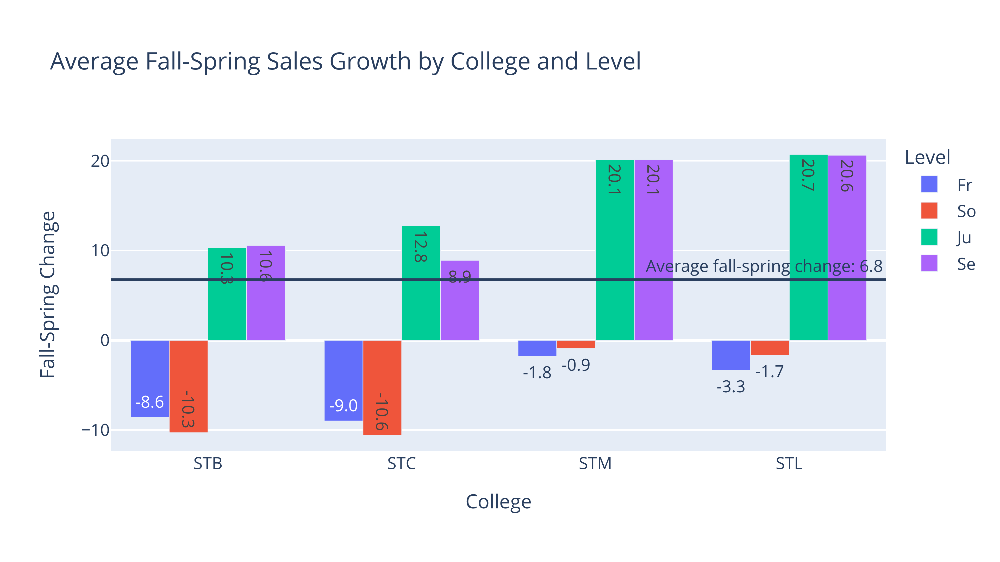

In [6]:
fig_fall_spring_sales_grouped_bar = px.bar(
    df_sales_pivot, x = 'college', y = 'Fall_Spring_Change',
      color = 'level', barmode = 'group', text_auto = '.1f',
      title = 'Average Fall-Spring Sales Growth \
by College and Level').update_layout(
    xaxis_title = 'College', yaxis_title = 'Fall-Spring Change',
legend_title = 'Level')

# Adding a reference line that displays the average fall-spring change:
avg_fall_spring_change = df_sales['Fall_Spring_Change'].mean()
fig_fall_spring_sales_grouped_bar.add_hline(y = 
                   avg_fall_spring_change,
                   annotation_text = f'Average fall-spring change: \
{round(avg_fall_spring_change, 1)}')
# For more on add_hline, 
# see # https://plotly.com/python/horizontal-vertical-shapes/ . 
wadi(fig_fall_spring_sales_grouped_bar, 
     'Charts/fall_spring_sales_grouped_bar', 
     display_type=display_type)

There are some interesting patterns here. First, STL and STM appeared to have higher fall-spring spending growth than did STB and STC. This suggests that the bookstore's marketing campaign had a positive impact, but it doesn't prove it. (Some unrelated factor, unbeknownst to us, migt have driven this growth--but it's still a positive sign for the marketing team.)

Second, average spending *dropped* for freshmen and sophomores but rose for juniors and seniors. Removing unhealthy snacks from the checkout aisles really might have depressed sales for younger students!

### Creating a linear regression using a formula approach:

We can now use a regression in order to examine the relationship between college, gender, level, and fall sales on spring spending. Thanks to Python's powerful statsmodels library, we can set up this regression with only a few lines of code.

I'll use Statsmodels' *formula* API for this section, as it easily accommodates categorical variables. (College and gender are examples of cateogrical variables, as their values are specific points rather than a range; a student can't be 'between' STB and STL. Fall spending, on the other hand, is an example of a continuous variable). 

The formula argument in the following code instructs Statsmodels to create a regression that evaluates the impact of our four independent variables (fall spending, college, level, and gender) on our dependent variable (spring spending). 

(The documentation at https://www.statsmodels.org/stable/examples/notebooks/generated/formulas.html proved very helpful in writing this section.)

In [7]:
sales_lr_1 = smf.ols(formula = "Spring ~ Fall + college + level + gender", 
                   data = df_sales) 
sales_lr_results_1 = sales_lr_1.fit()
sales_lr_results_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Spring   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     2439.
Date:                Tue, 18 Feb 2025   Prob (F-statistic):               0.00
Time:                        23:51:56   Log-Likelihood:                -76161.
No. Observations:               16384   AIC:                         1.523e+05
Df Residuals:                   16375   BIC:                         1.524e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept        -10.1260      0.871    -11.624      0.000     -11.833      -8.418
college[T.STC]     0.1049      0.574      0.183      0.855      -1.020       1.230
college[T.STL]     9.1326      0.572     15.977      0.000       8.012      10.253
college[T.STM]     9.0408      0.535     16.893      0.000       7.992      10.090
level[T.Ju]       21.3331      0.598     35.681      0.000      20.161      22.505
level[T.Se]       20.6960      0.564     36.703      0.000      19.591      21.801
level[T.So]       -0.4045      0.609     -0.665      0.506      -1.597       0.788
gender[T.M]       -0.0802      0.395     -0.203      0.839      -0.855       0.694
Fall               1.0020      0.008    126.954      0.000       0.987       1.018
==============================================================================
Omnibus:                        2.301   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.316   Jarque-Bera (JB):                2.306
Skew:                          -0.015   Prob(JB):                        0.316
Kurtosis:                       3.050   Cond. No.                         462.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Analyzing our first regression summary

There's a lot of output here, so I'll just focus on a few key elements.

The R^2 value at the top right suggests that 54.4% of all variance in spring spending can be explained by students' fall spending, college, gender, and level. That's a sizeable amount, though it still leaves almost half of students' spring spending patterns unexplained.

The midpoint of the regression summary contains a list of coefficients; these show the effect of each variable on spending after adjusting for all other variables. The `coeff` column displays the actual coefficients; the `[0.025` and `0.975]` columns show the 95% confidence interval for these coefficients; and the `P>|t|` column shows their p-values--i.e. the likelihood that we would have seen a coefficient of this magnitude if the actual coefficient was *not* 0.  

Note that the regression treats each college, gender, and level option as a boolean (binary) value: each respondent either belongs to that value or does not. (Meanwhile, fall spending is viewed as a continuous variable.) Thus, the `gender[T.M]` coefficient refers to male students; the `college[T.STL]` coefficient refers to STC students; and so on. 

You'll also note that, for each categorical variable, one value (F for gender, Fr for level, and STB for college) is missing from the results. This is the baseline value against which other values are compared. For example, the `college[T.STL]` coefficient of 9.13 means that, after adjusting for the other variables in our model, STL students spent around 9.13 more than STB students. Meanwhile, the `level[T.Ju]` coefficient of 21.33 means that juniors can be expected to spend around 21.33 more than freshmen (after accounting for our other variables).

The 'Fall' variable of 1.0020 means that every dollar of fall spending is associated with slightly more than one dollar in spring spending (again, after other variables are accounted for). 

The intercept predicts what a given student's spending would be if all input values equaled 0. In this case, a student with input values of 0 would be a female freshman at STB who spent $0 in the fall; this is because 'female', 'Fr' (for 'freshman'), and 'STB' are all missing from our coefficient lists, indicating that they are being treated as our baseline. 

Our p-values can help us determine which variables have a significant relationship with spending and which do not. The 0.839 p-value for the `gender[T.M]` variable, for instance, suggests that male students' spring spending didn't differ significantly from female students', even though women did spend slightly more than men. Our list of p-values also reveals that STL and STM students did spend significantly more than STB students, but STC students did not. (This suggests that the bookstore's marketing campaign had a significant positive impact on STL and STM spending--and that the management should consider launching this same campaign at STB and STC also.) Finally, we can see that juniors and seniors, but not sophomores, had significantly higher spending than freshmen. Maybe the unhealthy snacks that the bookstore phased out really *had* drawn in traffic from younger students!

## Using these regression results to make predictions

The first student within df_sales is a female freshman at STC who spent 66.80 at the bookstore in the fall. According to our model, how much would we have expected her to spend in the spring?

We can predict her spring spending total by starting with the intercept (which, as mentioned earlier, represents a female STB freshman who spent $0 in the fall); adding the product of our Fall coefficient and 66.8; and then adding the value of the STC coefficient. Here's what that total amounts to:

In [8]:
# Note that you can retrieve each regression coefficient via 
# the regression results' params attribute.
(sales_lr_results_1.params['Intercept'] 
 + sales_lr_results_1.params['Fall'] * 66.8 
 + sales_lr_results_1.params['college[T.STC]'])

np.float64(56.91483617475931)

As shown below, however, student's actual spring spending was only $43.20. The model did correctly predict a decrease in spring spending, but it underestimated the magnitude of this drop.

In [9]:
df_sales.iloc[0]

student_id            2020-1
gender                     F
college                  STC
level                     Fr
Fall                    66.8
Spring                  43.2
Fall_Spring_Change     -23.6
Name: 0, dtype: object

We can easily generate predictions for all rows within df_sales by using the results' `predict` method. (These predictions would be particularly useful for a new set of data for which we don't yet have our actual results.) Note that the value of our first prediction matches the one calculated above.

In [10]:
df_sales['Predictions'] = sales_lr_results_1.predict(
    df_sales[['Fall', 'gender', 'college', 'level']])
df_sales

,student_id,gender,college,level,Fall,Spring,Fall_Spring_Change,Predictions
0,2020-1,F,STC,Fr,66.80,43.20,-23.60,56.914836
1,2020-2,F,STM,Fr,104.67,130.17,25.50,103.797822
2,2020-3,F,STC,Fr,46.17,-8.95,-55.12,36.242865
3,2020-4,F,STC,Fr,58.68,53.95,-4.73,48.778316
...,...,...,...,...,...,...,...,...
16380,2023-5440,M,STM,Se,59.95,67.11,7.16,79.602623
16381,2023-5441,M,STL,Se,71.57,65.04,-6.53,91.337991
16382,2023-5442,M,STB,Se,100.52,61.14,-39.38,111.214315
16383,2023-5443,M,STM,Se,57.45,62.86,5.41,77.097536


Now that we've added all of our predictions, we can compare them to our actual results via a scatter plot:

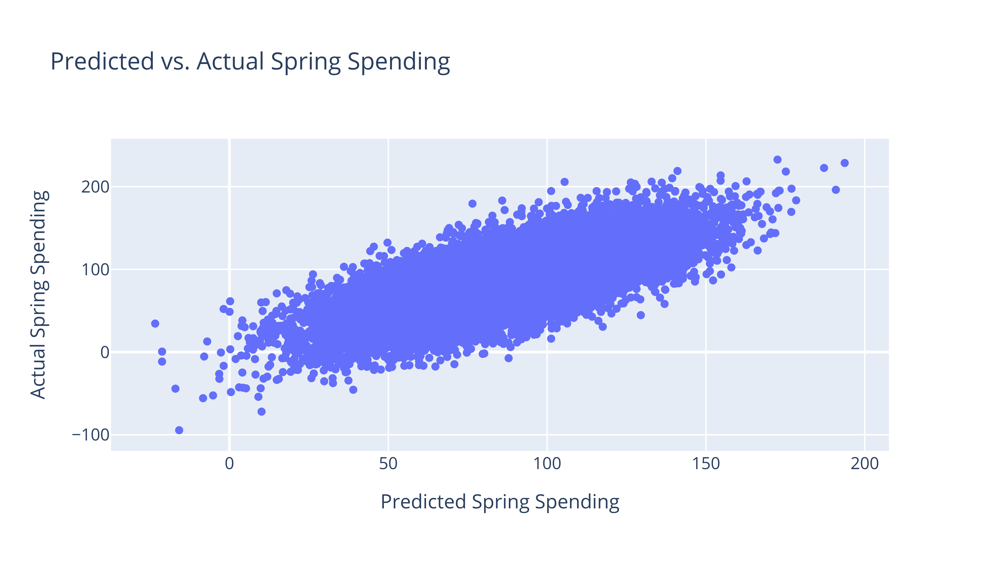

In [11]:
fig_spring_predictions_vs_actual = px.scatter(
    x = df_sales['Predictions'], y = df_sales['Spring'],
title = 'Predicted vs. Actual Spring Spending').update_layout(
    xaxis_title = 'Predicted Spring Spending', 
    yaxis_title = 'Actual Spring Spending')
wadi(fig_spring_predictions_vs_actual, 
'Charts/spring_predictions_vs_actual', display_type = display_type)

If you compare this graph to our 'Spring Sales as Function of Fall Sales' scatter plot, you'll find (perhaps after squinting for a bit) that our new chart's y axis values are clustered a bit more closely together. This makes sense, as our first chart took only fall sales into account; this new chart also considers the impact of college, level, and gender, and thus can make more accurate predictions of spring spending.)

## Checking the normality of our residuals

For a linear regression to be valid, certain criteria need to be met. A helpful overview of these assumptions can be found at https://ethanweed.github.io/pythonbook/05.04-regression.html#assumptions-of-regression ; a list of Statsmodels functions for testing regression assumptions is available at https://www.statsmodels.org/stable/diagnostic.html . 

As noted in the introduction, this chapter won't provide a detailed overview of all of these assumptions; however, if you plan to implement regressions in a professional setting, I strongly recommend that you look into these criteria and their corresponding tests. In the following cells, I'll check just one assumption: that the residuals of our regression are normally distributed.

We can visualize the distribution of our residuals via a histogram: (setting histnorm to 'probability density' will make this chart more compatible with a normal distribution curve that we'll add on top of it.)

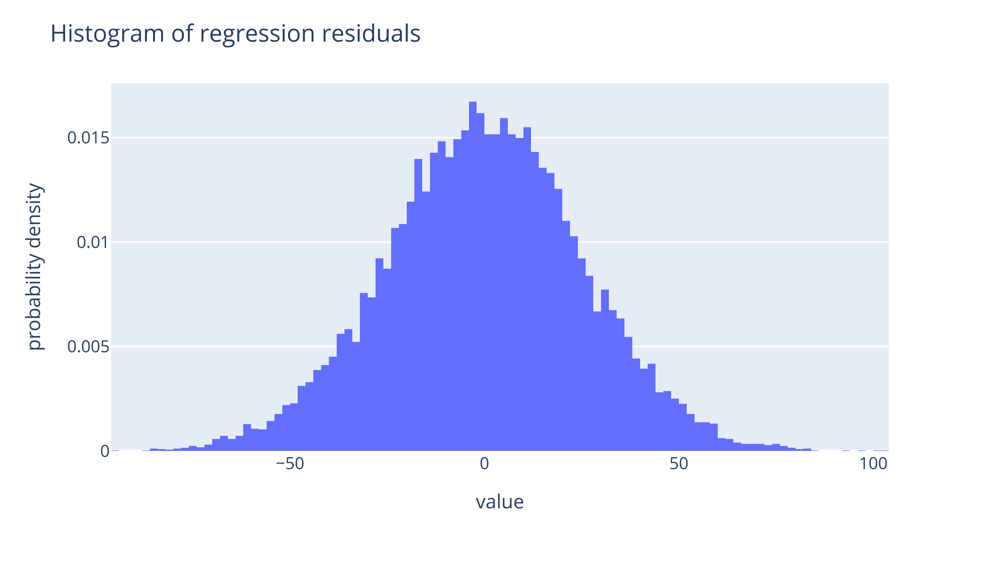

In [12]:
fig_sales_residual_hist = px.histogram(
    sales_lr_results_1.resid, 
    histnorm = 'probability density').update_layout(
    showlegend = False, title = 'Histogram of regression residuals')
wadi(fig_sales_residual_hist, 'Charts/sales_residual_hist',
    display_type = display_type)

Let's compare this distribution to a plot of a standard normal distribution. To plot this normal distribution, we'll first create a DataFrame that has a similar range of x values (-100 to 100) as the histogram above. This DataFrame's y values will be based on the normal distribution's probability density function; the standard deviation used within this function will match that of our residuals.

I converted the code for creating our normal distribution DataFrame into a function so that I could reuse it later in this section.

In [13]:
def gen_normdist(min, max, rows = 1000, mean = 0, stdev = 1):
    '''This function creates a DataFrame that 
    can be used to plot a normal distribution. The 'y' field within
    this DataFrame will show the normal distribution function's
    output for each 'x' field.
    
    min and max: the minimum and maximum x values to include within
    the DataFrame.

    rows: the number of rows to include within the DataFrame. Higher
    numbers will result in smoother plots.

    mean and stdev: the mean and standard deviation to use within the
    normal distribution function.
    '''
    df_normdist = pd.DataFrame(
        data={'x':np.linspace(min, max, rows+1)})
    # The code above uses np.linspace to list 'rows' values of x that range
    # from 'min' to 'max' (inclusive). For more on this function, see:
    # https://numpy.org/doc/stable/reference/generated/numpy.linspace.html
    
    df_normdist['y'] = (
    1/math.sqrt(2*math.pi*(stdev**2)))*math.e**(
        (-1*(df_normdist['x'] - mean)**2) / (2*stdev**2))
    # This code is based on the function found at
    # https://en.wikipedia.org/wiki/Normal_distribution
    return df_normdist

In [14]:
df_normdist = gen_normdist(
    min = -100, max = 100, 
    mean =0, stdev = np.std(sales_lr_results_1.resid))
df_normdist

,x,y
0,-100.0,0.000006
1,-99.8,0.000006
2,-99.6,0.000007
3,-99.4,0.000007
...,...,...
997,99.4,0.000007
998,99.6,0.000007
999,99.8,0.000006
1000,100.0,0.000006


We'll graph these x and y values using px.line():

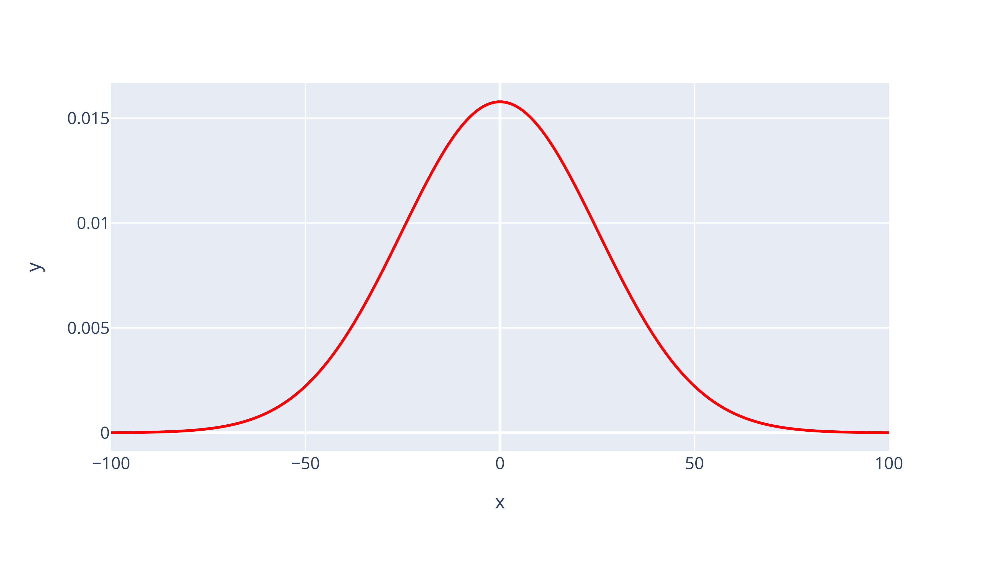

In [15]:
fig_normdist = px.line(df_normdist, x = 'x', y = 'y',
                      color_discrete_sequence = ['red'])
wadi(fig_normdist, 'normal_distribution_plot',
    display_type = display_type)

We can now add this curve directly onto our regression residuals plot via add_trace(). (This code was based on Shaunak Sen's StackOverflow response at https://stackoverflow.com/a/66891500/13097194 .) We'll also update our title to reflect our addition.

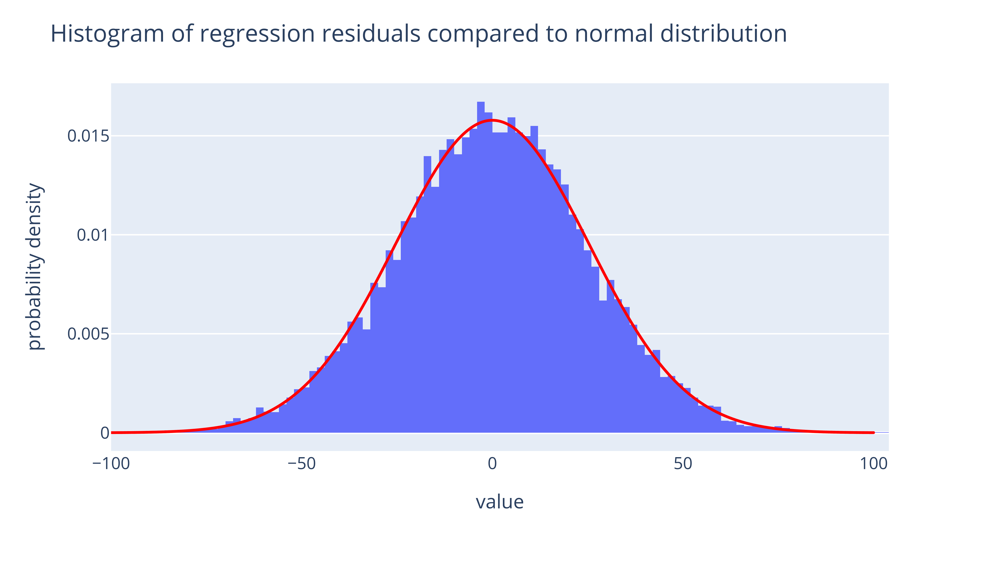

In [16]:
fig_sales_residual_hist.add_trace(
    fig_normdist['data'][0]).update_layout(
    title= 'Histogram of regression residuals compared to normal \
distribution')
wadi(fig_sales_residual_hist, 'Charts/sales_residual_hist_vs_normdist',
    display_type = display_type)

Our residuals graph aligns very closely to this normal distribution plot. For a more precise test, though, we can incorporate Statsmodels' omni_normtest function:

In [17]:
sms.omni_normtest(sales_lr_results_1.resid)

NormaltestResult(statistic=np.float64(2.3009693235324438), pvalue=np.float64(0.3164833448256659))

This p-value is above 0.05; which suggests that our residuals are indeed normally distributed. 

What sort of results would we get if our residuals did not match the normal distribution so well? Let's find out! The following cell creates a 'skewed' set of these residuals by multiplying all positive values by 2, then visualizes them using a histogram:

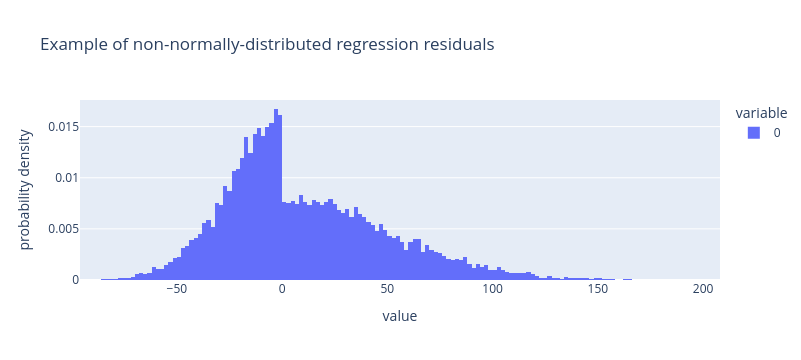

In [18]:
skewed_resids = [resid * 2 if resid > 0 else resid \
for resid in sales_lr_results_1.resid]

fig_skewed_resids = px.histogram(
    skewed_resids,
    histnorm = 'probability density',
title = 'Example of non-normally-distributed regression residuals')
fig_skewed_resids
wadi(fig_skewed_resids, 'skewed_residuals')

We'll now rerun our omni_normtest:

In [19]:
sms.omni_normtest(skewed_resids)

NormaltestResult(statistic=np.float64(1384.3509078332415), pvalue=np.float64(2.4661520825268643e-301))

This p value is incredibly small, indicating that our residuals are *not* normally distributed.

### Comparing fall sales between colleges

In the introduction, we discussed the whether the difference in fall STB and STL sales was statistically significant. We can now use a linear regression to find out.

First, we'll evaluate fall sales for each college, then determine how much higher STB's sales were than STL's.

In [20]:
df_fall_sales = df_sales.pivot_table(index = 'college',
                     values = 'Fall',
                     aggfunc = 'mean').reset_index()
df_fall_sales

,college,Fall
0,STB,80.281666
1,STC,80.201572
2,STL,79.691695
3,STM,80.153226


Calculating and reporting the nominal and % differences in fall sales between STL and STB:

In [21]:
fall_stb_sales = df_fall_sales.query("college == 'STB'").iloc[0]['Fall']
fall_stl_sales = df_fall_sales.query("college == 'STL'").iloc[0]['Fall']
stl_stb_nominal_diff = round(fall_stl_sales - fall_stb_sales, 2)
stl_stb_pct_diff = (round(100*(fall_stl_sales/fall_stb_sales-1), 2))
print(f"STB's average fall sales were {stl_stb_pct_diff}% lower (and \
{stl_stb_nominal_diff} lower in nominal terms) than were STL's.")

STB's average fall sales were -0.73% lower (and -0.59 lower in nominal terms) than were STL's.


In [22]:
sales_lr_2 = smf.ols(formula = "Fall ~ college", 
                   data = df_sales.query("college in ['STL', 'STB']")) 
sales_lr_results_2 = sales_lr_2.fit()
sales_lr_results_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Fall   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.083
Date:                Tue, 18 Feb 2025   Prob (F-statistic):              0.298
Time:                        23:52:09   Log-Likelihood:                -36655.
No. Observations:                7894   AIC:                         7.331e+04
Df Residuals:                    7892   BIC:                         7.333e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         80.2817      0.390    206.062      0.000      79.518      81.045
college[T.STL]    -0.5900      0.567     -1.041      0.298      -1.701       0.521
==============================================================================
Omnibus:                        0.914   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.633   Jarque-Bera (JB):                0.878
Skew:                           0.001   Prob(JB):                        0.645
Kurtosis:                       3.052   Cond. No.                         2.56
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Note that the intercept matches the fall STB spending that we calculated earlier; that's because it reflects fall STB spending. In addition, the STL coefficient matches the nominal difference in spending between STL and STB that we calculated earlier.

Our p-value is 0.298, which is well above the 0.05 signifciance threshold that we're using within this project. Thus, we'll conclude here that there was not a significant difference in fall spending between these two colleges.

### Comparing these results to those of a t-test

If you have a background in statistics, you may be familiar with t tests (https://en.wikipedia.org/wiki/Student's_t-test). Because our comparison of STL's and STB's fall spending includes two distinct sets of means, we could also have used an independent-samples t-test to determine whether they were statistically significant. That's exactly what the following cell does:

In [23]:
tstat, pvalue, dof = ttest_ind(
    x1 = df_sales.query("college == 'STL'")['Fall'], 
    x2 = df_sales.query("college == 'STB'")['Fall'])
# This code was based on the example shown at
# https://www.statsmodels.org/stable/generated/statsmodels.stats.
# weightstats.ttest_ind.html#statsmodels.stats.weightstats.ttest_ind
print("T statistic:",tstat, "\np-value:",pvalue)

T statistic: -1.0407829313964725 
p-value: 0.2980081862689233


Note, however, that the T statistic and p-value reported here perfectly match those for the STL coefficient in our regression model!


## Part 2: Evaluating the relationship between bachelor's degree prevalence and median incomes

Now that we've tried out regression models on simulated data, let's have a look at some real-world data. As explained back in the Census Data Imports section, NVCU's admissions department wishes to demonstrate that getting a bachelor's degree is, on average, a financial benefit to college graduates. 

Therefore, we retrieved American Community Survey data within that section that showed (1) median earnings for all residents aged 25 or older *and* (2) the percentage of residents who had a bachelor's degree. If these two metrics are positively correlated, that will boost the admissions department's case that going to college can help boost individuals' future earnings.* We'll now create regression models that evaluate whether there's a significant relationship between these two variables.

\**This is a flawed approach to demonstrating the financial benefits of a bachelor's degree: after all, the mere fact that median incomes are positively correlated with the percentage of residents who have a 4-year degree does *not* conclusively prove that bachelor's-degree holders earn more than high-school graduates. The latter group might earn just as much, or even more, than the former! However, I included this analysis so that I could show a real-world example of a regression model with continuous independent and dependent variables. Later in this section, I'll provide an additional model that directly compares bachelor's and high-school-degree earnings.*

## Importing data

In [24]:
df_cmib = pd.read_csv(
    '../Census_Data_Imports/Datasets/education_and_earnings_county.csv')
# 'cmib' is short for 'county median incomes and bachelor's degrees'.
# Simplifying our dataset by removing extraneous fields:

df_cmib.drop(['Year', 'state', 'county'], axis = 1, inplace = True)
# Limiting our output to counties in one of the 50 US states (plus DC):
df_cmib.query("State_Abbrev != 'PR'", inplace = True)
df_cmib[['NAME', 'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree']]


,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree
0,"Autauga County, Alabama",47719,28.282680
1,"Baldwin County, Alabama",47748,32.797637
2,"Barbour County, Alabama",34557,11.464715
3,"Bibb County, Alabama",34001,11.468207
...,...,...,...
3140,"Teton County, Wyoming",55463,61.219716
3141,"Uinta County, Wyoming",43883,21.319190
3142,"Washakie County, Wyoming",42474,22.032358
3143,"Weston County, Wyoming",47865,18.043478


### Cleaning our dataset

Our dataset includes not only median earnings for all county residents, but earnings for specific education levels also. Let's take a look at these averages (the 'mean of the medians', if you will):

In [25]:
median_earnings_cols = ['Median_Earnings_for_Total_25plus_Population',
                       'Median_Earnings_Less_Than_HS',
                        'Median_Earnings_HS',
                        'Median_Earnings_Some_College',
                        "Median_Earnings_Bachelors_Degree",
                        "Median_Earnings_Postgraduate"]
df_cmib[median_earnings_cols].mean()

Median_Earnings_for_Total_25plus_Population   -3.794012e+05
Median_Earnings_Less_Than_HS                  -4.089420e+07
Median_Earnings_HS                            -3.779011e+06
Median_Earnings_Some_College                  -1.653628e+06
Median_Earnings_Bachelors_Degree              -4.396728e+06
Median_Earnings_Postgraduate                  -1.795533e+07
dtype: float64

Well, these number don't seem right--they're all negative! What's going on?

The issue here is that the number -666,666,666 is getting used as a code for missing income statistics. The presence of this giant negative number within our dataset is dramatically skewing our average calculations.

You can identify this number by calling .min() on the dataset's median income columns:

In [26]:
df_cmib[median_earnings_cols].min()

Median_Earnings_for_Total_25plus_Population   -666666666
Median_Earnings_Less_Than_HS                  -666666666
Median_Earnings_HS                            -666666666
Median_Earnings_Some_College                  -666666666
Median_Earnings_Bachelors_Degree              -666666666
Median_Earnings_Postgraduate                  -666666666
dtype: int64

I also looked for other unusually small values that might represent additional codes for invalid data, but I didn't find any:

In [27]:
for col in median_earnings_cols:
    print(df_cmib.sort_values(col)[col].unique())

[-666666666      19366      23388 ...      96611      97482     106932]
[-666666666       2499       3417 ...      87929     105764     128554]
[-666666666      13961      15238 ...      75434      84750      88493]
[-666666666      16806      17040 ...      90183      93458     100365]
[-666666666       2499      18963 ...     110960     115313     158333]
[-666666666       2499      13750 ...     154872     164519     250001]


I'll now remove invalid 'Median_Earnings_for_Total_25+_Population' entries from our dataset by filtering out rows with *negative* values. (I could have only filtered out rows with entries of -666666666, but that code would fail to work for future versions of this dataset if the Census Bureau happened to replace that number with a different one.)

Since the only earnings row that we'll be using in our dataset is the 'Median_Earnings_for_Total_25+_Population' one, I won't filter out invalid numbers in other columns just yet, as that would cause many rows with valid 'Median_Earnings_for_Total_25+_Population' entries to get removed.

In [28]:
df_cmib.query("`Median_Earnings_for_Total_25plus_Population` >= 0", 
              inplace = True)
# Enclosing this field in backticks helped query() correctly parse it.

# Confirming that we removed all -666666666 values from our overall
# median earnings column:
df_cmib[['NAME', 'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree']].sort_values(
    'Median_Earnings_for_Total_25plus_Population').head(5)

,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree
2593,"Edwards County, Texas",19366,25.921909
1113,"Wolfe County, Kentucky",23388,7.393428
571,"Custer County, Idaho",23782,25.196424
2548,"Brooks County, Texas",24585,14.440783
285,"Mineral County, Colorado",24783,54.532164


As in the first section, we'll visualize our data before incorporating it into a model. The following scatter plot shows how the prevalence of bachelor's degrees correlates with median earnings. The dots are also color-coded by region to help us identify any regional patterns that might be present.

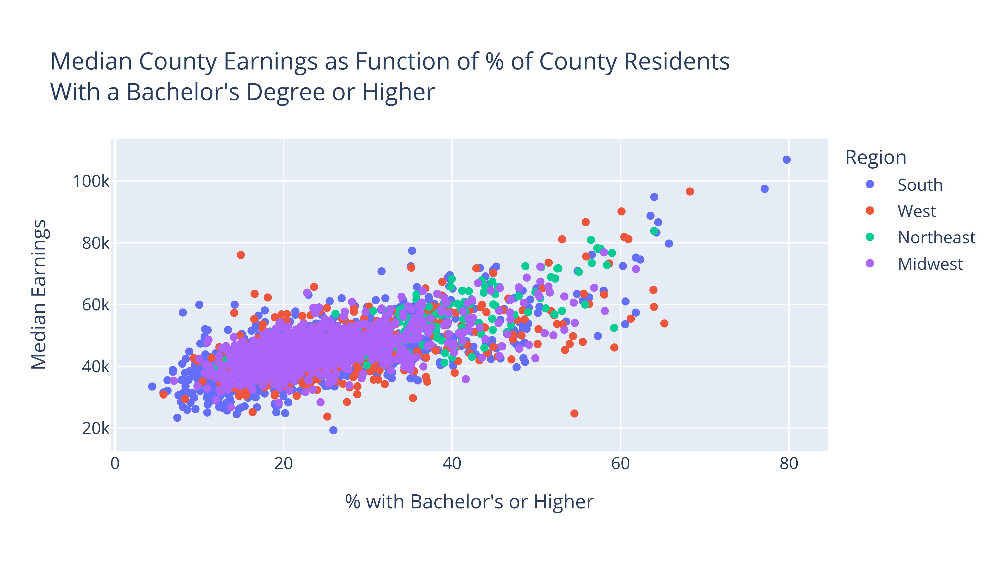

In [29]:
fig_ba_pct_earnings_scatter = px.scatter(
    df_cmib, x = "Pct_With_Bachelors_Degree", 
           y = 'Median_Earnings_for_Total_25plus_Population',
           color = 'Region', hover_data = 'NAME',
title = "Median County Earnings as Function of % of County \
Residents<br>With a Bachelor's Degree or Higher").update_layout(
    xaxis_title = "% with Bachelor's \
or Higher", yaxis_title = "Median Earnings")
# Note the use of <br>, a piece of HTML code, in the title to add in 
# a line break. For more documentation on applying HTML code within
# Plotly text elements, visit 
# https://plotly.com/chart-studio-help/adding-HTML-and-links-to-charts/ . 
# (This page is meant for Plotly's paid Chart Studio offering, but 
# many or all of the HTML items will also work within free Plotly
# graphs.)
wadi(fig_ba_pct_earnings_scatter, 'Charts/county_ba_pct_earnings_scatter',
     display_type = display_type)

I'm seeing a hint of a curve in the above scatter plot. Therefore, in order to allow our model to better account for this curve, I'll add in a squared version of the 'Pct_With_Bachelors_Degree' column. 

In [30]:
df_cmib['Pct_With_Bachelors_Degree_Squared'] = df_cmib[
'Pct_With_Bachelors_Degree']**2

### Building our first regression model

This model will use both the original and squared versions of our bachelor's degree prevalence field in order to predict median earnings. (This is because I found both of these elements to have a statistically significant relationship with our earnings values.)

In [31]:
cmib_lr_1 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree + \
Pct_With_Bachelors_Degree_Squared", 
                   data = df_cmib) 
cmib_lr_results_1 = cmib_lr_1.fit()
cmib_lr_results_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         OLS Regression Results                                        
=======================================================================================================
Dep. Variable:     Median_Earnings_for_Total_25plus_Population   R-squared:                       0.498
Model:                                                     OLS   Adj. R-squared:                  0.497
Method:                                          Least Squares   F-statistic:                     1555.
Date:                                         Tue, 18 Feb 2025   Prob (F-statistic):               0.00
Time:                                                 23:52:12   Log-Likelihood:                -31696.
No. Observations:                                         3142   AIC:                         6.340e+04
Df Residuals:                                             3139   BIC:                         6.342e+04
Df Model:                                                    2                                         
Covariance Type:                                     nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                          3.477e+04    588.871     59.038      0.000    3.36e+04    3.59e+04
Pct_With_Bachelors_Degree           283.5300     41.660      6.806      0.000     201.847     365.213
Pct_With_Bachelors_Degree_Squared     4.5607      0.655      6.961      0.000       3.276       5.845
==============================================================================
Omnibus:                      175.709   Durbin-Watson:                   1.591
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              664.486
Skew:                           0.119   Prob(JB):                    5.11e-145
Kurtosis:                       5.240   Cond. No.                     5.35e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.35e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Our R^2 value is close to 0.5, indicating that the prevalence of bachelor's degrees explains roughly half of all variation in county-level incomes.

Next, let's create a revised version of this regression model that also takes counties' regional settings into account.

In [32]:
cmib_lr_2 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree + \
Pct_With_Bachelors_Degree_Squared + Region", 
                   data = df_cmib) 
cmib_lr_results_2 = cmib_lr_2.fit()
cmib_lr_results_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         OLS Regression Results                                        
=======================================================================================================
Dep. Variable:     Median_Earnings_for_Total_25plus_Population   R-squared:                       0.514
Model:                                                     OLS   Adj. R-squared:                  0.513
Method:                                          Least Squares   F-statistic:                     663.0
Date:                                         Tue, 18 Feb 2025   Prob (F-statistic):               0.00
Time:                                                 23:52:13   Log-Likelihood:                -31645.
No. Observations:                                         3142   AIC:                         6.330e+04
Df Residuals:                                             3136   BIC:                         6.334e+04
Df Model:                                                    5                                         
Covariance Type:                                     nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                          3.709e+04    635.611     58.356      0.000    3.58e+04    3.83e+04
Region[T.Northeast]                1232.3922    436.812      2.821      0.005     375.926    2088.858
Region[T.South]                   -1944.9595    237.961     -8.173      0.000   -2411.535   -1478.384
Region[T.West]                    -1682.2203    326.246     -5.156      0.000   -2321.897   -1042.543
Pct_With_Bachelors_Degree           199.2065     42.178      4.723      0.000     116.507     281.906
Pct_With_Bachelors_Degree_Squared     5.6411      0.657      8.584      0.000       4.353       6.930
==============================================================================
Omnibus:                      225.565   Durbin-Watson:                   1.636
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              902.064
Skew:                           0.245   Prob(JB):                    1.32e-196
Kurtosis:                       5.579   Cond. No.                     5.98e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.98e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Each region-level predictor is significant as well. (Note that, because 'Region' is a categorical variable, each region (aside from the baseline midwest value) is listed as a separate coefficient; these coefficients show how much more (or less) each region's median earnings are after adjusting for our bachelor's-degree fields.)

Next, we'll examine the difference between our predicted and actual county-level median incomes. (Instead of using `predict()` to generate our predicted values, we'll simply retrieve these from the `fittedvalues` attribute of our regression results. Similarly, we'll source our regression residuals from our results' `resid` attribute.)

In [33]:
df_cmib_pred_vs_actual = df_cmib.copy()[['NAME', 
'Median_Earnings_for_Total_25plus_Population',
'Pct_With_Bachelors_Degree', 'Pct_With_Bachelors_Degree_Squared', 
'Region']].copy()

# Displaying the model's predictions for each county:
df_cmib_pred_vs_actual['Pred_Val'] = cmib_lr_results_2.fittedvalues
# Source of this attribute:
# https://www.statsmodels.org/dev/generated/statsmodels.regression.
# linear_model.OLSResults.html
# Note: we could also have generated these values using the following
# code:
# df_cmib_pred_vs_actual['Pred_Val'] = cmib_lr_results_2.predict(
#     df_cmib_pred_vs_actual[
#     ['Pct_With_Bachelors_Degree',
#      'Pct_With_Bachelors_Degree_Squared', 'Region']])

# Displaying our model's errors for each county:
df_cmib_pred_vs_actual['Actual-Pred'] = cmib_lr_results_2.resid
# We could also have calculated these using the following code:
# df_cmib_pred_vs_actual['Actual-Pred'] = (
#     df_cmib_pred_vs_actual[
#     'Median_Earnings_for_Total_25plus_Population'] - 
#     df_cmib_pred_vs_actual['Pred_Val'])


df_cmib_pred_vs_actual.sort_values(
    'Actual-Pred', ascending = False).head(5)

,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree,Pct_With_Bachelors_Degree_Squared,Region,Pred_Val,Actual-Pred
87,"North Slope Borough, Alaska",76090,14.927417,222.827783,West,39640.377288,36449.622712
1198,"Calvert County, Maryland",77471,35.262776,1243.463362,South,49186.122657,28284.877343
2874,"Loudoun County, Virginia",94853,64.013746,4097.759728,South,71014.991163,23838.008837
1202,"Charles County, Maryland",70792,31.637943,1000.959444,South,47096.033650,23695.966350
1212,"St. Mary's County, Maryland",72426,35.100217,1232.025268,South,49089.216077,23336.783923


The table above shows the five counties whose median incomes our model underestimated the most. The first county equivalent within this list (North Slope Borough, AK) has a median income of 76,090-around 36,449 higher than would be predicted using its Region (West) and bachelor's degree-prevalence (14.92%) only. My guess is that many workers in this county without college degrees are highly-paid oil and natural gas workers, which would explain why its median income is higher than expected.

Next, we'll visualize our predicted and actual earnings. If our R^2 were 100, all of these points would exist on the same line. However, becasue our R^2 was only 0.514, we can see plenty of variation in actual median earnings for most predicted medians.

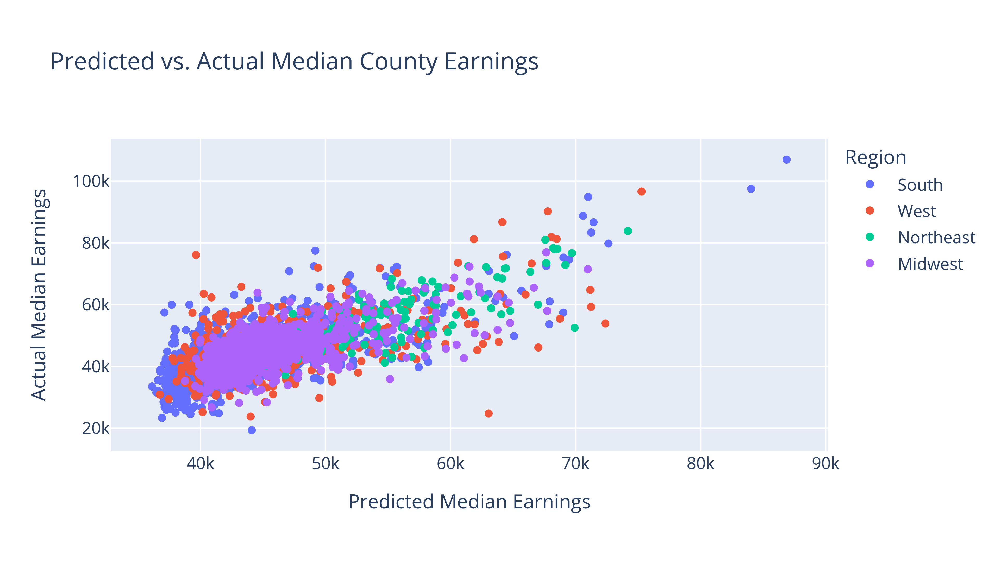

In [34]:
fig_cmib_pred_vs_actual = px.scatter(
    df_cmib_pred_vs_actual, x = 'Pred_Val', 
           y = 'Median_Earnings_for_Total_25plus_Population', 
           color = 'Region',
          hover_data = 'NAME', title = "Predicted vs. Actual Median \
County Earnings").update_layout(
    xaxis_title = 'Predicted Median Earnings', 
    yaxis_title = 'Actual Median Earnings')
wadi(fig_cmib_pred_vs_actual, 'Charts/cmib_pred_vs_actual',
     display_type=display_type)

Finally, we'll compare a histogram of our residuals to a representative normal distribution:

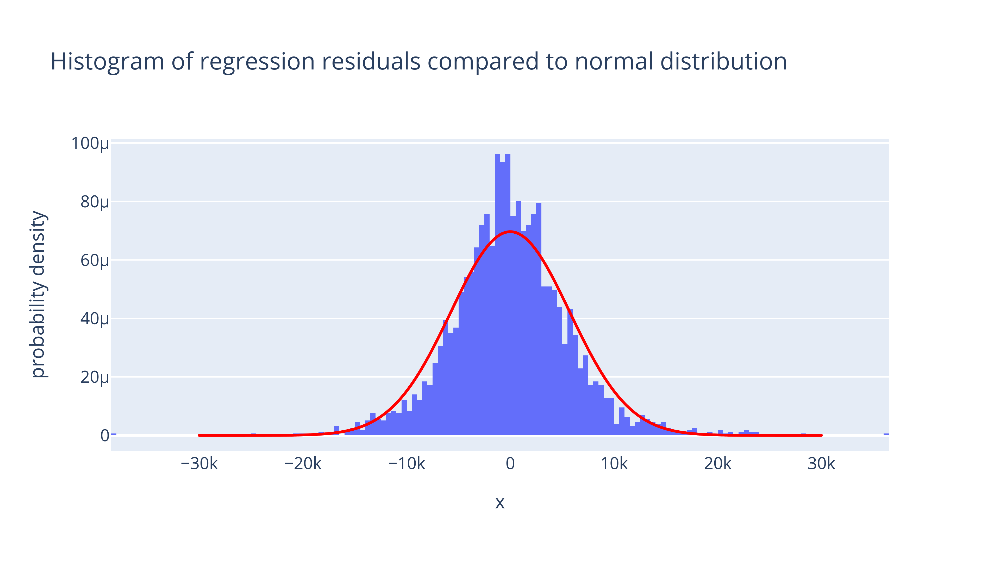

In [35]:
fig_cmib_hist = px.histogram(
    x = cmib_lr_results_2.resid, 
    title = 'Histogram of regression residuals compared to \
normal distribution',
histnorm = 'probability density')

# Adding a normal distribution line: 
# (Unlike in the earlier section, we'll generate the DataFrame for our 
# normal distribution *and* its corresponding line chart in the same
# line that adds this chart to our histogram. This saves a few lines
# of code but does make the output a bit less readable.)

fig_cmib_hist.add_trace(
    px.line(gen_normdist(
    min = -30000, max = 30000, rows = 1000,
    mean = 0, stdev = np.std(cmib_lr_results_2.resid)),
       x = 'x', y = 'y', color_discrete_sequence = ['red'])['data'][0])

wadi(fig_cmib_hist, 'Charts/cmib_residual',
     display_type=display_type)


The central section of our histogram is notably higher than the corresponding normal distribution line, which suggsts that our residuals are not normally distributed. The following omni_normtest agrees with this conclusion:

In [36]:
sms.omni_normtest(cmib_lr_results_2.resid)

NormaltestResult(statistic=np.float64(225.5648729751166), pvalue=np.float64(1.0452259364221645e-49))

## Performing state-level regressions:

In [37]:
df_smib = pd.read_csv(
    '../Census_Data_Imports/Datasets/education_and_earnings_state.csv')
df_smib.query("State_Abbrev not in ['PR']", inplace = True)
df_smib.drop(['Year', 'state', 'State_Abbrev'], axis = 1, inplace = True)
# Limiting our output to counties in one of the 50 US states (plus DC):

df_smib.head()

,NAME,Total_Population,Educational Attainment for the Population 25 Years and Over_Estimate!!Total: (B15003_001E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Bachelor's degree (B15003_022E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Master's degree (B15003_023E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Professional school degree (B15003_024E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Doctorate degree (B15003_025E),Median_Earnings_for_Total_25plus_Population,Median_Earnings_Less_Than_HS,Median_Earnings_HS,Median_Earnings_Some_College,Median_Earnings_Bachelors_Degree,Median_Earnings_Postgraduate,Pct_With_Bachelors_Degree,Region
0,Alabama,5054253,3448302,584986,269176,58744,44175,45197,29246,36273,41510,59318,72667,27.755139,South
1,Alaska,733971,487903,95793,41004,9294,6341,56492,33492,42584,53446,68158,90606,31.242276,West
2,Arizona,7268175,4990633,999535,454564,99314,74049,49333,32329,39212,45811,65087,82033,32.610332,West
3,Arkansas,3032651,2043779,324625,137592,29944,21060,42450,30773,35652,39782,56594,72437,25.111375,South
4,California,39242785,26941198,6035609,2587003,703157,508592,54437,31554,40371,48785,78553,108925,36.503058,West


Confirming that no median earnings columns within our state-level dataset contain the invalid entries that we saw in our county-level file:

In [38]:
df_smib[median_earnings_cols].min()

Median_Earnings_for_Total_25plus_Population    41331
Median_Earnings_Less_Than_HS                   26749
Median_Earnings_HS                             33805
Median_Earnings_Some_College                   38500
Median_Earnings_Bachelors_Degree               52657
Median_Earnings_Postgraduate                   64563
dtype: int64

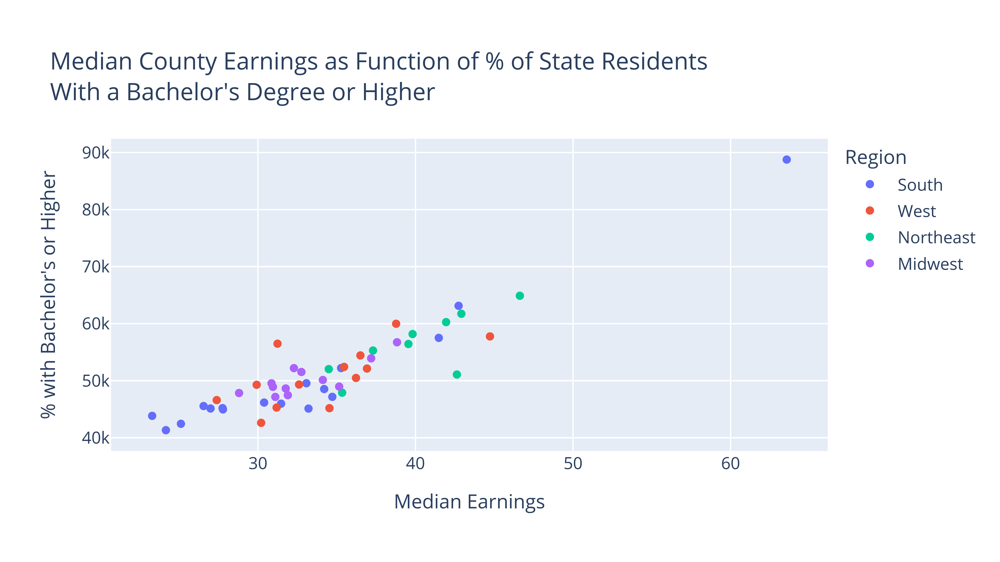

In [39]:
fig_smib_scatter = px.scatter(
    df_smib, x = "Pct_With_Bachelors_Degree", 
           y = 'Median_Earnings_for_Total_25plus_Population',
           color = 'Region', hover_data = 'NAME',
    title = "Median County Earnings as Function of % of State \
Residents<br>With a Bachelor's Degree or Higher").update_layout(
    xaxis_title = 'Median Earnings', yaxis_title = "% with Bachelor's \
or Higher")
wadi(fig_smib_scatter, 'Charts/state_ba_pct_earnings_scatter',
     display_type = display_type)

DC has a far higher median income *and* percentage of residents with bachelor's degrees than any state. Therefore, as it constitutes an outlier, I'll go ahead and remove it from our dataset.

In [40]:
df_smib.query("NAME != 'District of Columbia'", inplace = True)

Here's an updated scatter plot without DC:

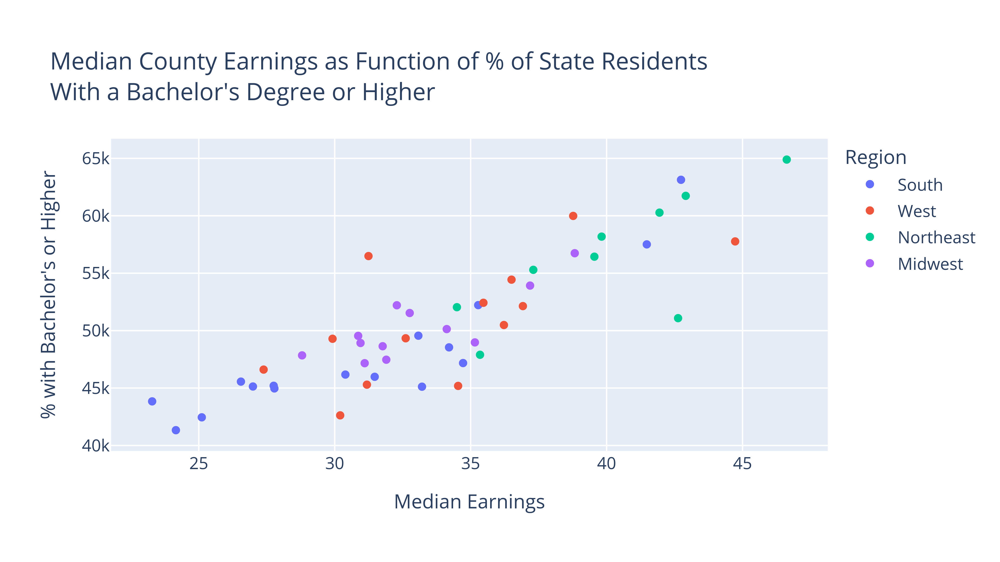

In [41]:
fig_smib_scatter = px.scatter(
    df_smib, x = "Pct_With_Bachelors_Degree", 
           y = 'Median_Earnings_for_Total_25plus_Population',
           color = 'Region', hover_data = 'NAME',
    title = "Median County Earnings as Function of % of State \
Residents<br>With a Bachelor's Degree or Higher").update_layout(
    xaxis_title = 'Median Earnings', yaxis_title = "% with Bachelor's \
or Higher")
wadi(fig_smib_scatter, 'Charts/state_ba_pct_earnings_scatter',
     display_type = display_type)

To me, the relationship between our independent and dependent variables appears quite linear; however, I ultimately found that a squared version of the 'Pct_With_Bachelors_Degree' field ended up having higher predictive power than the non-squared version.

In [42]:
df_smib['Pct_With_Bachelors_Degree_Squared'] = (
    df_smib['Pct_With_Bachelors_Degree']**2)
df_smib.head()

,NAME,Total_Population,Educational Attainment for the Population 25 Years and Over_Estimate!!Total: (B15003_001E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Bachelor's degree (B15003_022E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Master's degree (B15003_023E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Professional school degree (B15003_024E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Doctorate degree (B15003_025E),Median_Earnings_for_Total_25plus_Population,Median_Earnings_Less_Than_HS,Median_Earnings_HS,Median_Earnings_Some_College,Median_Earnings_Bachelors_Degree,Median_Earnings_Postgraduate,Pct_With_Bachelors_Degree,Region,Pct_With_Bachelors_Degree_Squared
0,Alabama,5054253,3448302,584986,269176,58744,44175,45197,29246,36273,41510,59318,72667,27.755139,South,770.347720
1,Alaska,733971,487903,95793,41004,9294,6341,56492,33492,42584,53446,68158,90606,31.242276,West,976.079786
2,Arizona,7268175,4990633,999535,454564,99314,74049,49333,32329,39212,45811,65087,82033,32.610332,West,1063.433766
3,Arkansas,3032651,2043779,324625,137592,29944,21060,42450,30773,35652,39782,56594,72437,25.111375,South,630.581133
4,California,39242785,26941198,6035609,2587003,703157,508592,54437,31554,40371,48785,78553,108925,36.503058,West,1332.473208


## Performing a linear regression:

First, we'll try building a regression model that includes bachelor's degree percentages; a squared version of this percentage; and our Region field.

In [43]:
smib_lr_1 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree_Squared + \
Pct_With_Bachelors_Degree + Region",
    data = df_smib) 
smib_lr_results_1 = smib_lr_1.fit()
smib_lr_results_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         OLS Regression Results                                        
=======================================================================================================
Dep. Variable:     Median_Earnings_for_Total_25plus_Population   R-squared:                       0.764
Model:                                                     OLS   Adj. R-squared:                  0.737
Method:                                          Least Squares   F-statistic:                     28.47
Date:                                         Tue, 18 Feb 2025   Prob (F-statistic):           9.27e-13
Time:                                                 23:52:20   Log-Likelihood:                -466.59
No. Observations:                                           50   AIC:                             945.2
Df Residuals:                                               44   BIC:                             956.7
Df Model:                                                    5                                         
Covariance Type:                                     nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                          4.782e+04   1.53e+04      3.134      0.003    1.71e+04    7.86e+04
Region[T.Northeast]                -824.2885   1508.486     -0.546      0.588   -3864.442    2215.865
Region[T.South]                   -1632.7421   1198.674     -1.362      0.180   -4048.511     783.027
Region[T.West]                     -689.3360   1178.346     -0.585      0.562   -3064.136    1685.464
Pct_With_Bachelors_Degree_Squared    22.4137     12.595      1.780      0.082      -2.969      47.796
Pct_With_Bachelors_Degree          -670.3622    875.607     -0.766      0.448   -2435.032    1094.308
==============================================================================
Omnibus:                        4.800   Durbin-Watson:                   2.124
Prob(Omnibus):                  0.091   Jarque-Bera (JB):                5.691
Skew:                          -0.110   Prob(JB):                       0.0581
Kurtosis:                       4.638   Cond. No.                     4.62e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.62e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Only the intercept is statistically significant! Is our model doomed? Not at all--we just need to reduce the number of predictors. Let's see what happens when we remove the 'Pct_With_Bachelors_Degree' predictor, as its p-value is far higher than its squared version:

In [44]:
smib_lr_1 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree_Squared + Region",
    data = df_smib) 
smib_lr_results_1 = smib_lr_1.fit()
smib_lr_results_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         OLS Regression Results                                        
=======================================================================================================
Dep. Variable:     Median_Earnings_for_Total_25plus_Population   R-squared:                       0.761
Model:                                                     OLS   Adj. R-squared:                  0.739
Method:                                          Least Squares   F-statistic:                     35.77
Date:                                         Tue, 18 Feb 2025   Prob (F-statistic):           1.91e-13
Time:                                                 23:52:20   Log-Likelihood:                -466.92
No. Observations:                                           50   AIC:                             943.8
Df Residuals:                                               45   BIC:                             953.4
Df Model:                                                    4                                         
Covariance Type:                                     nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                          3.621e+04   1693.707     21.381      0.000    3.28e+04    3.96e+04
Region[T.Northeast]                -554.2037   1459.895     -0.380      0.706   -3494.584    2386.177
Region[T.South]                   -1304.8976   1114.414     -1.171      0.248   -3549.443     939.648
Region[T.West]                     -609.9461   1168.364     -0.522      0.604   -2963.153    1743.261
Pct_With_Bachelors_Degree_Squared    12.8269      1.345      9.538      0.000      10.118      15.535
==============================================================================
Omnibus:                        4.113   Durbin-Watson:                   2.050
Prob(Omnibus):                  0.128   Jarque-Bera (JB):                4.268
Skew:                          -0.110   Prob(JB):                        0.118
Kurtosis:                       4.414   Cond. No.                     5.73e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.73e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The Pct_With_Bachelors_Degree_Squared field is now a statistically significant predictor. However, all of the 'Region' categories are still insignificant, so I'll go ahead and remove them. Doing so ended up increasing the adjusted R^2 out of my regression:

In [45]:
smib_lr_1 = smf.ols(formula = "Median_Earnings_for_Total_\
25plus_Population ~ Pct_With_Bachelors_Degree_Squared",
    data = df_smib) 
smib_lr_results_1 = smib_lr_1.fit()
smib_lr_results_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         OLS Regression Results                                        
=======================================================================================================
Dep. Variable:     Median_Earnings_for_Total_25plus_Population   R-squared:                       0.753
Model:                                                     OLS   Adj. R-squared:                  0.748
Method:                                          Least Squares   F-statistic:                     146.6
Date:                                         Tue, 18 Feb 2025   Prob (F-statistic):           3.35e-16
Time:                                                 23:52:20   Log-Likelihood:                -467.68
No. Observations:                                           50   AIC:                             939.4
Df Residuals:                                               48   BIC:                             943.2
Df Model:                                                    1                                         
Covariance Type:                                     nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                          3.526e+04   1339.845     26.319      0.000    3.26e+04     3.8e+04
Pct_With_Bachelors_Degree_Squared    13.0572      1.078     12.110      0.000      10.889      15.225
==============================================================================
Omnibus:                        3.676   Durbin-Watson:                   2.064
Prob(Omnibus):                  0.159   Jarque-Bera (JB):                3.438
Skew:                          -0.126   Prob(JB):                        0.179
Kurtosis:                       4.260   Cond. No.                     4.13e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.13e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [46]:
df_smib_pred_vs_actual = df_smib.copy()[
['NAME', 'Median_Earnings_for_Total_25plus_Population',
 'Pct_With_Bachelors_Degree_Squared', 'Region']]
df_smib_pred_vs_actual['Pred_Val'] = smib_lr_results_1.predict(
    df_smib_pred_vs_actual[['Pct_With_Bachelors_Degree_Squared']])
df_smib_pred_vs_actual
df_smib_pred_vs_actual['Actual-Pred'] = (
    df_smib_pred_vs_actual['Median_Earnings_for_Total_25plus_Population'] - 
    df_smib_pred_vs_actual['Pred_Val'])

In [47]:
df_smib_pred_vs_actual.sort_values(
    'Actual-Pred', ascending = False).head(8)

,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree_Squared,Region,Pred_Val,Actual-Pred
1,Alaska,56492,976.079786,West,48008.674448,8483.325552
47,Washington,59987,1503.152620,West,54890.768989,5096.231011
20,Maryland,63133,1826.396975,South,59111.434646,4021.565354
34,North Dakota,52208,1042.311655,Midwest,48873.477097,3334.522903
30,New Jersey,61736,1841.314202,Northeast,59306.211838,2429.788162
50,Wyoming,49290,895.224605,West,46952.932310,2337.067690
49,Wisconsin,51533,1073.109104,Midwest,49275.605504,2257.394496
29,New Hampshire,58184,1585.362528,Northeast,55964.200072,2219.799928


In [48]:
df_smib_pred_vs_actual.sort_values(
    'Actual-Pred').head(8)

,NAME,Median_Earnings_for_Total_25plus_Population,Pct_With_Bachelors_Degree_Squared,Region,Pred_Val,Actual-Pred
45,Vermont,51085,1817.202826,Northeast,58991.384818,-7906.384818
26,Montana,45186,1192.942470,West,50840.293537,-5654.293537
31,New Mexico,42621,912.149489,West,47173.923887,-4552.923887
9,Florida,45117,1102.923670,South,49664.900210,-4547.900210
33,North Carolina,47176,1205.528668,South,51004.634015,-3828.634015
19,Maine,47897,1249.235138,Northeast,51575.318064,-3678.318064
5,Colorado,57768,2000.592904,West,61385.945451,-3617.945451
12,Idaho,45294,972.459715,West,47961.406465,-2667.406465


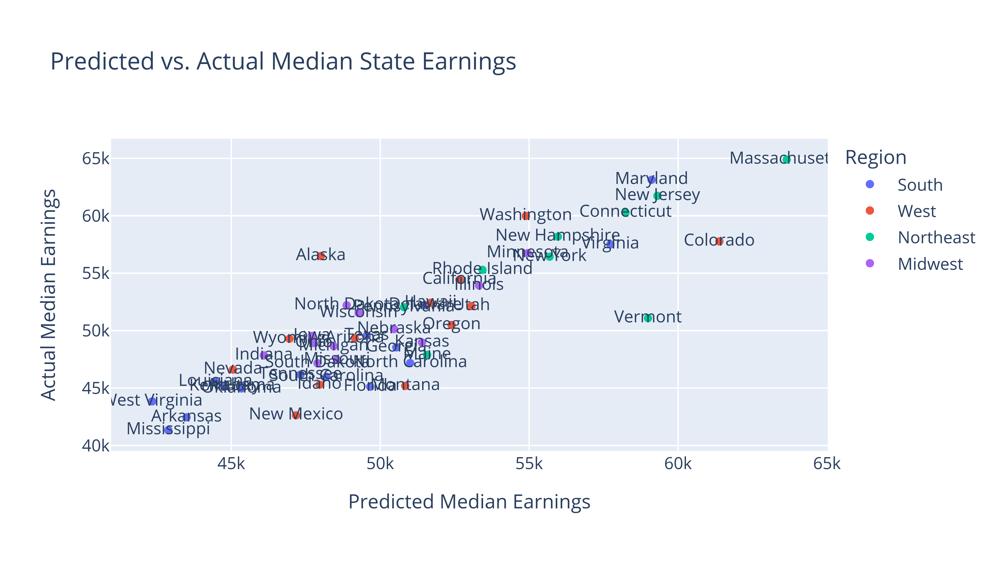

In [49]:
fig_smib_pred_vs_actual = px.scatter(
    df_smib_pred_vs_actual, x = 'Pred_Val', 
           y = 'Median_Earnings_for_Total_25plus_Population',
    color = 'Region', hover_data = 'NAME', text = 'NAME',
    title = "Predicted vs. Actual Median State Earnings").update_layout(
    xaxis_title = 'Predicted Median Earnings', 
    yaxis_title = 'Actual Median Earnings')
wadi(fig_smib_pred_vs_actual, 'Charts/smib_pred_vs_actual',
     display_type=display_type)

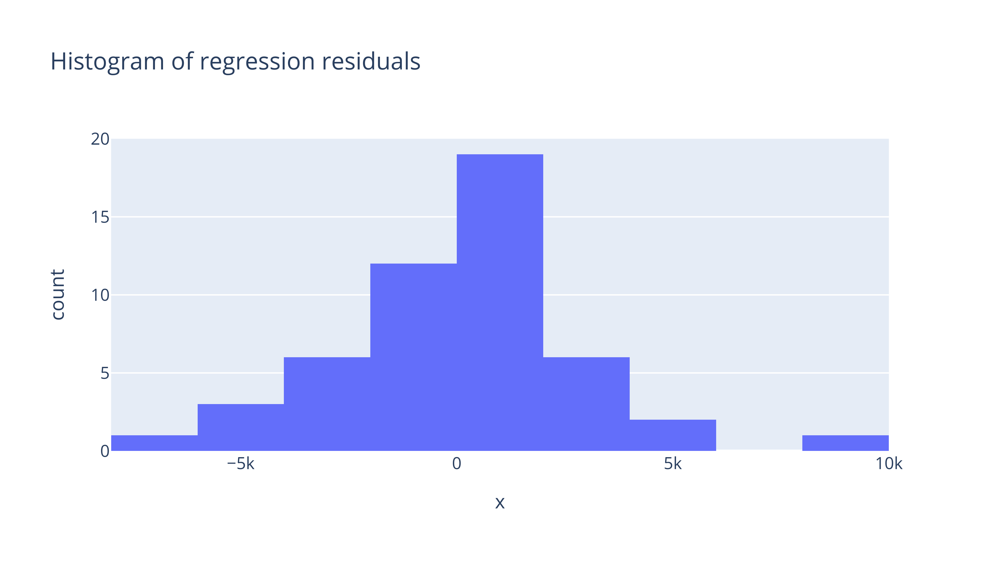

In [50]:
fig_smib_hist = px.histogram(
    x = smib_lr_results_1.resid,
title = 'Histogram of regression residuals')
wadi(fig_smib_hist, 'Charts/smib_residual',
     display_type=display_type)

In [51]:
sms.omni_normtest(
    smib_lr_results_1.resid)

NormaltestResult(statistic=np.float64(3.6759444784110493), pvalue=np.float64(0.15913979659171434))

## Comparing median earnings for different education levels

Importing national medians (which will prove more useful for certain analyses than county- or state-level medians):

In [52]:
df_nmib = pd.read_csv(
    '../Census_Data_Imports/Datasets/education_and_earnings_national.csv')
df_nmib

,Year,us,NAME,Total_Population,Educational Attainment for the Population 25 Years and Over_Estimate!!Total: (B15003_001E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Bachelor's degree (B15003_022E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Master's degree (B15003_023E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Professional school degree (B15003_024E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Doctorate degree (B15003_025E),Median_Earnings_for_Total_25plus_Population,Median_Earnings_Less_Than_HS,Median_Earnings_HS,Median_Earnings_Some_College,Median_Earnings_Bachelors_Degree,Median_Earnings_Postgraduate,Pct_With_Bachelors_Degree
0,2023,1,United States,332387540,228434661,48591540,22436592,5226273,3699897,51184,31492,38789,45840,67849,88719,35.00095


In [53]:
df_cmib_ec = df_cmib.copy() # ec = 'earnings_comparison'

In [54]:
for col in median_earnings_cols:
    df_cmib_ec.query(f'`{col}` >= 0', inplace = True)
print(len(df_cmib_ec))

# The following code creates a new set of columns that determines
# the percentage change in median earnings between certain educational
# attainment categories.

for df in [df_nmib, df_cmib_ec]:

    df['Pct_Median_Earnings_Increase_non_HS_to_HS'] = (
    100*(df['Median_Earnings_HS'] / 
         df['Median_Earnings_Less_Than_HS'] - 1))
    
    df['Pct_Median_Earnings_Increase_HS_to_Bachelors'] = (
    100*(df['Median_Earnings_Bachelors_Degree'] / 
         df['Median_Earnings_HS'] - 1))
    
    df['Pct_Median_Earnings_Increase_Bachelors_to_Postgraduate'] = (
    100*(df['Median_Earnings_Postgraduate'] / 
         df['Median_Earnings_Bachelors_Degree'] - 1))
    
    df['Pct_Median_Earnings_Increase_HS_to_Postgraduate'] = (
    100*(df['Median_Earnings_Postgraduate'] / 
         df['Median_Earnings_HS'] - 1))
  
    
df_nmib

2869


,Year,us,NAME,Total_Population,Educational Attainment for the Population 25 Years and Over_Estimate!!Total: (B15003_001E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Bachelor's degree (B15003_022E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Master's degree (B15003_023E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Professional school degree (B15003_024E),Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Doctorate degree (B15003_025E),Median_Earnings_for_Total_25plus_Population,Median_Earnings_Less_Than_HS,Median_Earnings_HS,Median_Earnings_Some_College,Median_Earnings_Bachelors_Degree,Median_Earnings_Postgraduate,Pct_With_Bachelors_Degree,Pct_Median_Earnings_Increase_non_HS_to_HS,Pct_Median_Earnings_Increase_HS_to_Bachelors,Pct_Median_Earnings_Increase_Bachelors_to_Postgraduate,Pct_Median_Earnings_Increase_HS_to_Postgraduate
0,2023,1,United States,332387540,228434661,48591540,22436592,5226273,3699897,51184,31492,38789,45840,67849,88719,35.00095,23.170964,74.918147,30.759481,128.72206


## Comparing median earnings values at both the national level and the median county level

(Expound more on this section--my guess is that the national HS-bachelor's increase is higher than the county-level one because people with bachelor's degrees are more likely to be in higher-earning counties, thus accentuating the difference in earnings; thus, just comparing national HS and bachelor's salaries may not be as accurate as comparing county-level readings in which people are in similar economic regions. However, you could also argue that the ability of people to move between counties means that the national-level % differences are still valid; people with bachelor's degrees might simply choose to move to higher-earning counties, and that's certainly relevant for our analysis.)

In [55]:
df_national_earnings_by_ed_level = df_nmib[median_earnings_cols].transpose(
).reset_index().rename(
    columns = {'index':'Category', 0:'Median Earnings'})

# The following code uses both str.replace() and replace() to 
# convert the education levels in the Category field to a more concise
# and readable format.
df_national_earnings_by_ed_level['Education Level'] = (
    df_national_earnings_by_ed_level['Category'].str.replace(
    'Median_Earnings_', '').str.replace('_',' ')).replace(
        {'for Total 25plus Population':'Total 25+ Population',
        'Bachelors Degree':"Bachelor's"})
df_national_earnings_by_ed_level

,Category,Median Earnings,Education Level
0,Median_Earnings_for_Total_25plus_Population,51184,Total 25+ Population
1,Median_Earnings_Less_Than_HS,31492,Less Than HS
2,Median_Earnings_HS,38789,HS
3,Median_Earnings_Some_College,45840,Some College
4,Median_Earnings_Bachelors_Degree,67849,Bachelor's
5,Median_Earnings_Postgraduate,88719,Postgraduate


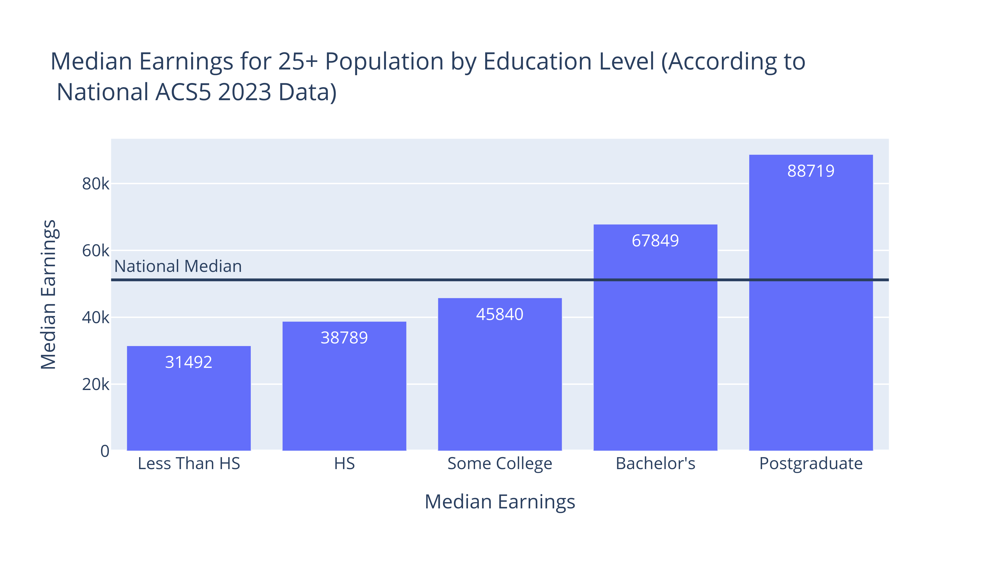

In [56]:
fig_national_median_earnings = px.bar(
    df_national_earnings_by_ed_level.query(
    "Category != 'Median_Earnings_for_Total_25plus_Population'"), 
       x = 'Education Level', y = 'Median Earnings', text_auto = '.0f',
      title = 'Median Earnings for 25+ Population by Education Level \
(According to<br> National ACS5 2023 Data)').update_layout(
    xaxis_title = 'Median Earnings')
# Adding a horizontal line to represent the national median income--along
# with an annotation to clarify to the reader that their monitor is not
# glitching out!
# https://plotly.com/python/horizontal-vertical-shapes/
fig_national_median_earnings.add_hline(
    y = df_national_earnings_by_ed_level.query("Category == \
'Median_Earnings_for_Total_25plus_Population'").iloc[0][
    'Median Earnings'], annotation_text = 'National Median',
annotation_position = 'top left')
wadi(fig_national_median_earnings, 'Charts/national_median_earnings',
     display_type=display_type)

In [57]:
df_county_earnings_by_ed_level = df_cmib_ec[median_earnings_cols].median(
).reset_index().rename(
    columns = {'index':'Category', 0:'Median Earnings'})
# I could have used the same replace()/str.replace() function shown
# within the national median earnings dataset to create our 
# 'Education Level' column, but for comparison purposes, I'll instead
# use Series.map():
df_county_earnings_by_ed_level['Education Level'] = (
    df_county_earnings_by_ed_level['Category'].map(
        {'Median_Earnings_for_Total_25plus_Population':
         'Total 25+ Population',
    'Median_Earnings_Less_Than_HS':'Less Than HS',
    'Median_Earnings_HS':'HS',
    'Median_Earnings_Some_College':'Some College',
    'Median_Earnings_Bachelors_Degree':"Bachelor's Degree",
    'Median_Earnings_Postgraduate':'Postgraduate'}
    ))
df_county_earnings_by_ed_level

,Category,Median Earnings,Education Level
0,Median_Earnings_for_Total_25plus_Population,43831.0,Total 25+ Population
1,Median_Earnings_Less_Than_HS,31706.0,Less Than HS
2,Median_Earnings_HS,37525.0,HS
3,Median_Earnings_Some_College,42494.0,Some College
4,Median_Earnings_Bachelors_Degree,55859.0,Bachelor's Degree
5,Median_Earnings_Postgraduate,69258.0,Postgraduate


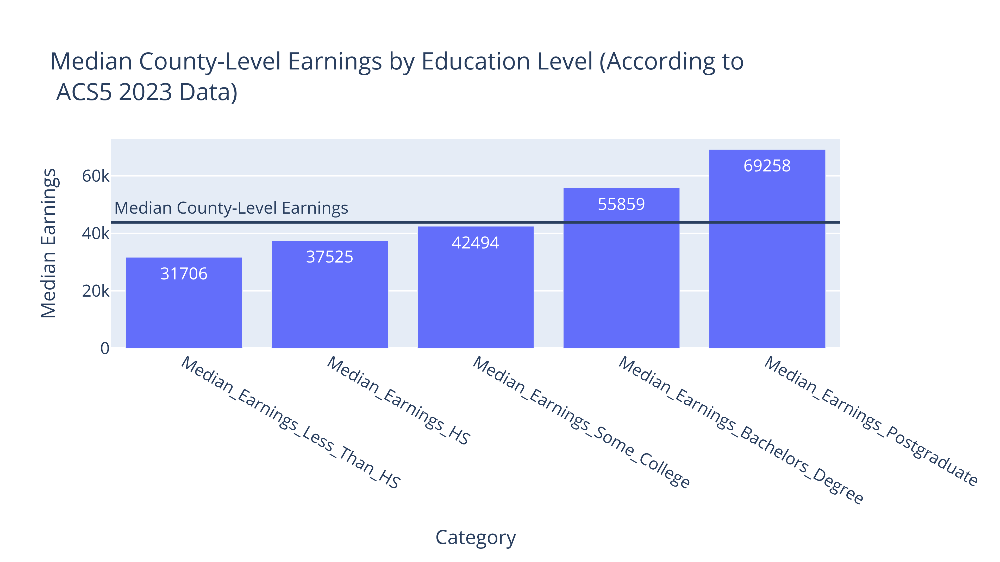

In [58]:
fig_county_median_earnings = px.bar(
    df_county_earnings_by_ed_level.query(
    "Category != 'Median_Earnings_for_Total_25plus_Population'"), 
       x = 'Category', y = 'Median Earnings', text_auto = '.0f',
      title = 'Median County-Level Earnings by Education Level \
(According to<br> ACS5 2023 Data)')
fig_county_median_earnings.add_hline(
    y = df_county_earnings_by_ed_level.query("Category == \
'Median_Earnings_for_Total_25plus_Population'").iloc[0][
    'Median Earnings'], annotation_text = 'Median County-Level Earnings',
annotation_position = 'top left')
wadi(fig_county_median_earnings, 'Charts/county_median_earnings',
     display_type=display_type)

Identifying the regions with 50,000 or more residents that have the highest percentage difference in median incomes between bachelor's-degree holders and high-school graduates:

In [59]:
df_cmib_ec.columns

Index(['NAME', 'Total_Population',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total: (B15003_001E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Bachelor's degree (B15003_022E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Master's degree (B15003_023E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Professional school degree (B15003_024E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Doctorate degree (B15003_025E)',
       'Median_Earnings_for_Total_25plus_Population',
       'Median_Earnings_Less_Than_HS', 'Median_Earnings_HS',
       'Median_Earnings_Some_College', 'Median_Earnings_Bachelors_Degree',
       'Median_Earnings_Postgraduate', 'Pct_With_Bachelors_Degree',
       'State_Abbrev', 'Region', 'Pct_With_Bachelors_Degree_Squared',
       'Pct_Median_Earnings_Increase_non_HS_to_HS'

In [60]:
df_cmib_ec.query("Total_Population >= 50000").sort_values(
    'Pct_Median_Earnings_Increase_HS_to_Bachelors', 
                       ascending = False)[
['NAME', 'Pct_Median_Earnings_Increase_HS_to_Bachelors']].head(8)

,NAME,Pct_Median_Earnings_Increase_HS_to_Bachelors
2828,"Arlington County, Virginia",184.147394
224,"San Francisco County, California",169.921759
1860,"New York County, New York",166.556683
2917,"Alexandria city, Virginia",161.109609
321,"District of Columbia, District of Columbia",142.831086
229,"Santa Clara County, California",135.489613
2850,"Fairfax County, Virginia",132.574208
2874,"Loudoun County, Virginia",130.743637


5 of these 8 regions are in the Northern Virigina/DC area; thus, the NVCU admissions team can point out to prospective applicants that a college degree *may* prove particularly lucrative in the NoVA area, where NVCU is located.

Counties with 50K+ residents that had the *lowest* estimated increase in median earnings from a high-school diploma to a bachelor's degree:

In [61]:
df_cmib_ec.query("Total_Population >= 50000").sort_values(
    'Pct_Median_Earnings_Increase_HS_to_Bachelors')[
['NAME', 'Pct_Median_Earnings_Increase_HS_to_Bachelors']].head(5)

,NAME,Pct_Median_Earnings_Increase_HS_to_Bachelors
1767,"Carroll County, New Hampshire",9.674226
1224,"Franklin County, Massachusetts",13.896043
1115,"Acadia Parish, Louisiana",14.493175
2592,"Ector County, Texas",15.193989
2049,"Athens County, Ohio",16.409321


## Comparisons of median high school and bachelor's earnings

My guess is that oil and/or natural gas extraction explains the high median earnings in Alaska's North Slope Borough and McKenzie County (and possibly other regions within this list as well).

In [62]:
df_cmib_ec.sort_values('Median_Earnings_HS', ascending = False)[
['NAME', 'Total_Population', 'Median_Earnings_HS']].head(8)

,NAME,Total_Population,Median_Earnings_HS
87,"North Slope Borough, Alaska",10891,88493
2966,"Garfield County, Washington",2326,68646
2772,"Winkler County, Texas",7540,67924
265,"Elbert County, Colorado",27152,62404
2018,"McKenzie County, North Dakota",14280,61058
2001,"Cavalier County, North Dakota",3663,60083
949,"Meade County, Kansas",3949,59145
93,"Southeast Fairbanks Census Area, Alaska",6936,59050


In [63]:
df_cmib_ec.sort_values(
    'Median_Earnings_Bachelors_Degree', ascending = False)[
['NAME', 'Total_Population', 'Median_Earnings_Bachelors_Degree']].head(8)

,NAME,Total_Population,Median_Earnings_Bachelors_Degree
2874,"Loudoun County, Virginia",427082,110960
224,"San Francisco County, California",836321,109016
229,"Santa Clara County, California",1903297,108483
75,"Dillingham Census Area, Alaska",4780,105104
207,"Marin County, California",258765,101238
227,"San Mateo County, California",745100,100853
2828,"Arlington County, Virginia",235463,98781
1465,"Sharkey County, Mississippi",3848,97500


Comparing median HS and bachelor's degree earnings: (counties above the regression line have higher-than-expected median bachelor's degree earnings relative to HS ones; for those below the line, the relationship is the opposite.)

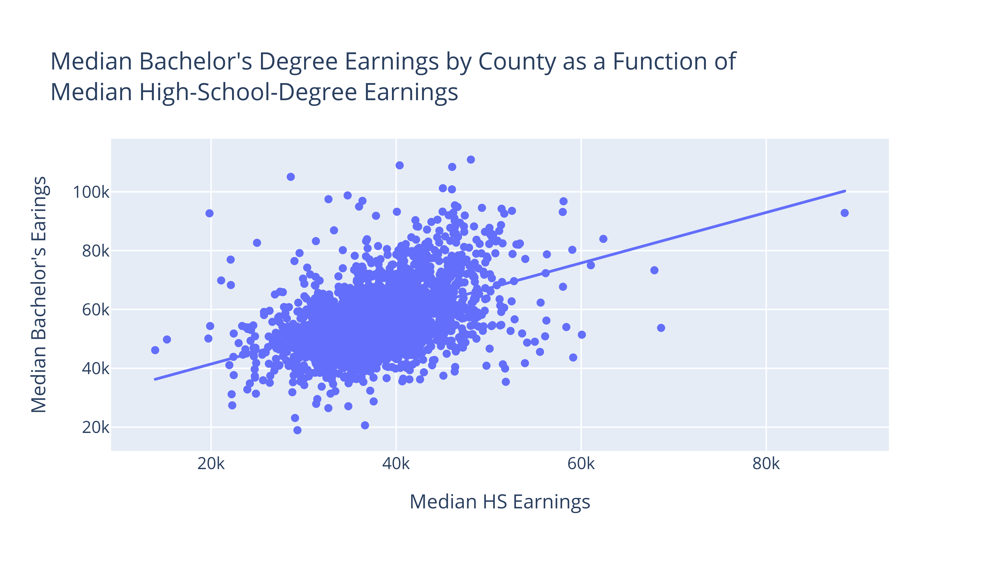

In [64]:
fig_hs_vs_bachelors_earnings = px.scatter(
    df_cmib_ec, x = 'Median_Earnings_HS',
           y = 'Median_Earnings_Bachelors_Degree',
          trendline = 'ols', hover_data = 'NAME',
title = "Median Bachelor's Degree Earnings by County as a Function \
of<br>Median High-School-Degree Earnings").update_layout(
    xaxis_title = 'Median HS Earnings', 
    yaxis_title = "Median Bachelor's Earings")
                                   
wadi(fig_hs_vs_bachelors_earnings, 'Charts/hs_bachelors_earnings_scatter',
    display_type=display_type)

## Using a regression model to determine whether median earnings for bachelor's-degree holders are significantly higher than high-school-degree holders

In [65]:
df_cmib.columns

Index(['NAME', 'Total_Population',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total: (B15003_001E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Bachelor's degree (B15003_022E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Master's degree (B15003_023E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Professional school degree (B15003_024E)',
       'Educational Attainment for the Population 25 Years and Over_Estimate!!Total:!!Doctorate degree (B15003_025E)',
       'Median_Earnings_for_Total_25plus_Population',
       'Median_Earnings_Less_Than_HS', 'Median_Earnings_HS',
       'Median_Earnings_Some_College', 'Median_Earnings_Bachelors_Degree',
       'Median_Earnings_Postgraduate', 'Pct_With_Bachelors_Degree',
       'State_Abbrev', 'Region', 'Pct_With_Bachelors_Degree_Squared'],
      dtype='object')

In [66]:
df_county_earnings_melt = df_cmib.melt(
    id_vars = 'NAME', value_vars = [
        'Median_Earnings_Less_Than_HS',
        'Median_Earnings_HS', 
        'Median_Earnings_Some_College',
        'Median_Earnings_Bachelors_Degree',
        'Median_Earnings_Postgraduate'], var_name = 'Education Level', 
             value_name = 'Median Earnings').sort_values(
    'NAME').query("`Median Earnings` != -666666666").reset_index(drop=True)
df_county_earnings_melt['Education Level'] = (df_county_earnings_melt[
    'Education Level'].str.replace('Median_Earnings_','').str.replace(
        '_',' ').str.replace('Bachelors',"Bachelor's").copy())

# Creating an integer-based sort column that can be used to sort
# graph entries more logically:
df_county_earnings_melt['Ed_Sort_Map'] = df_county_earnings_melt[
'Education Level'].map({'Less Than HS':0,'HS':1,
                        'Some College':2,
                        "Bachelor's Degree":3,
                        'Postgraduate':4})
df_county_earnings_melt.sort_values('Ed_Sort_Map', inplace = True)
df_county_earnings_melt.head()

,NAME,Education Level,Median Earnings,Ed_Sort_Map
6093,"Henry County, Alabama",Less Than HS,25231,0
6099,"Henry County, Georgia",Less Than HS,40316,0
15334,"York County, Maine",Less Than HS,40334,0
15339,"York County, Nebraska",Less Than HS,31332,0
15341,"York County, Pennsylvania",Less Than HS,35382,0


We can try visualizing the effect of degree type on median earnings via a scatter plot, but with only a few axis levels, this chart will be challenging to interpret:

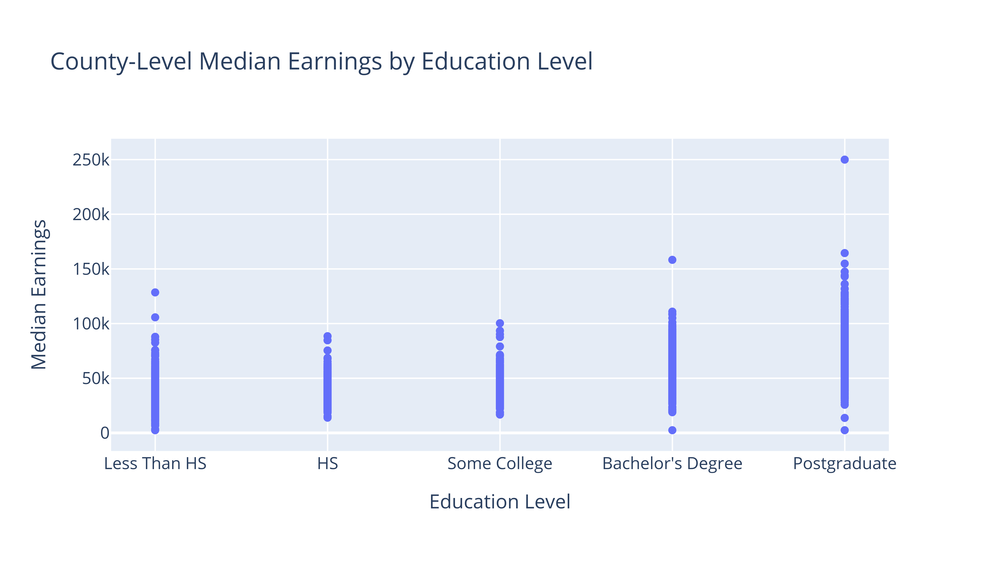

In [67]:
fig_county_earnings_scatter = px.scatter(
    df_county_earnings_melt, 
           x = 'Education Level', y = 'Median Earnings',
          hover_data = 'NAME', title = "County-Level Median Earnings by \
Education Level")
wadi(fig_county_earnings_scatter, 
     'Charts/county_earnings_scatter',
    display_type = display_type)

A better option will be to create a grouped histogram: (Note: to make the histogram a bit clearer, I'll filter out bars representing median earnings above 100,000.)

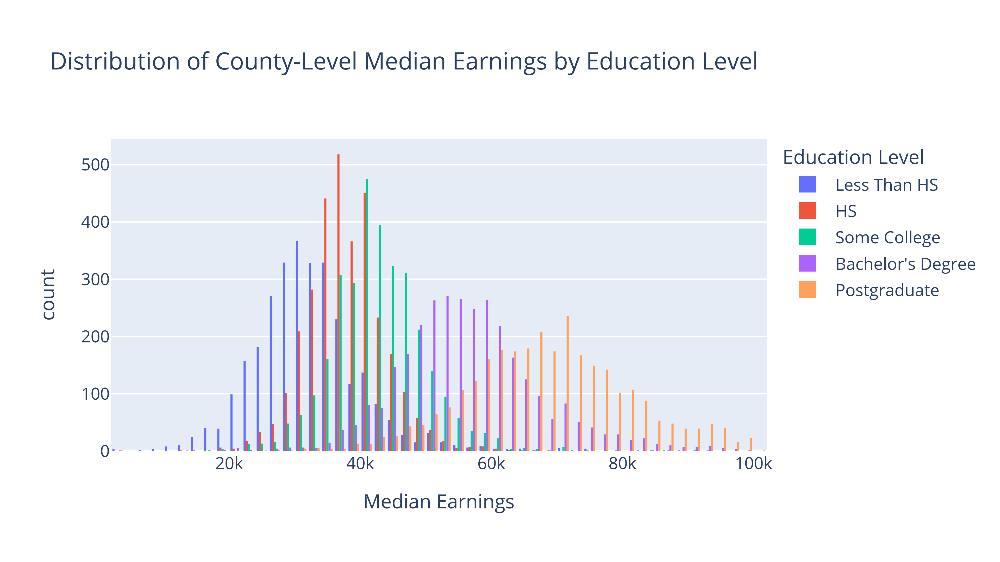

In [68]:
fig_county_earnings_hist = px.histogram(
    df_county_earnings_melt.query("`Median Earnings` <= 100000"), 
    x = 'Median Earnings', color = 'Education Level', barmode = 'group',
title = "Distribution of County-Level Median Earnings by Education Level", 
    nbins = 80)
# nbins helps control the level of detail featured in our histogram.
# For more on this variable, see
# https://plotly.com/python/histograms/
    
wadi(fig_county_earnings_hist, 
     'Charts/hs_bachelors_earnings_hist', display_type = display_type)

I'll admit that this isn't the clearest chart either; however, it does reveal notable differences in the shapes and locations of each education level's distribution. For instance, though there's some overlap between the two, the 'HS' category is far to the left of the 'Bachelor's Degree' category, which in turn is located to the left of the 'Postgraduate' category. In addition, the 'HS' bars appear more concentrated than do the 'Postgraduate' bars, which are quite spread out. (I imagine that this is because there are fewer postgraduate-degree holders in the US; as a result, their median county-level earnings may be more spread out due to their smaller sample size.)

The following regression model compares median county-level earnings for individuals whose highest education level was (1) a high school diploma and (2) a college degree:

(Becuase the 'Median Earnings' field has a space in it, we need to use `Q()`, a function of the patsy library that helps power statsmodels' formula functionality, to correctly parse it. For more on this convention, see https://patsy.readthedocs.io/en/latest/builtins-reference.html#patsy.builtins.Q)

In [69]:
df_county_earnings_melt

,NAME,Education Level,Median Earnings,Ed_Sort_Map
6093,"Henry County, Alabama",Less Than HS,25231,0
6099,"Henry County, Georgia",Less Than HS,40316,0
15334,"York County, Maine",Less Than HS,40334,0
15339,"York County, Nebraska",Less Than HS,31332,0
...,...,...,...,...
9184,"Mecklenburg County, Virginia",Postgraduate,75913,4
9172,"Meade County, South Dakota",Postgraduate,72523,4
39,"Adair County, Oklahoma",Postgraduate,54917,4
15392,"Ziebach County, South Dakota",Postgraduate,57981,4


In [70]:
county_ed_level_earnings_lr = smf.ols(
    formula = "Q('Median Earnings') ~ Q('Education Level')", 
    data = df_county_earnings_melt) 
county_ed_level_earnings_lr_results = county_ed_level_earnings_lr.fit()
county_ed_level_earnings_lr_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     Q('Median Earnings')   R-squared:                       0.642
Model:                              OLS   Adj. R-squared:                  0.642
Method:                   Least Squares   F-statistic:                     6895.
Date:                  Tue, 18 Feb 2025   Prob (F-statistic):               0.00
Time:                          23:52:29   Log-Likelihood:            -1.6394e+05
No. Observations:                 15393   AIC:                         3.279e+05
Df Residuals:                     15388   BIC:                         3.279e+05
Df Model:                             4                                         
Covariance Type:              nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
Intercept                             5.656e+04    182.779    309.428      0.000    5.62e+04    5.69e+04
Q('Education Level')[T.HS]           -1.856e+04    258.405    -71.811      0.000   -1.91e+04    -1.8e+04
Q('Education Level')[T.Less Than HS] -2.426e+04    262.206    -92.538      0.000   -2.48e+04   -2.37e+04
Q('Education Level')[T.Postgraduate]  1.376e+04    259.815     52.966      0.000    1.33e+04    1.43e+04
Q('Education Level')[T.Some College] -1.372e+04    258.220    -53.133      0.000   -1.42e+04   -1.32e+04
==============================================================================
Omnibus:                     5856.049   Durbin-Watson:                   1.962
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           100042.074
Skew:                           1.379   Prob(JB):                         0.00
Kurtosis:                      15.181   Cond. No.                         5.79
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [71]:
county_ed_level_earnings_lr_results.params

Intercept                               56556.863869
Q('Education Level')[T.HS]             -18556.280376
Q('Education Level')[T.Less Than HS]   -24263.901145
Q('Education Level')[T.Postgraduate]    13761.442767
Q('Education Level')[T.Some College]   -13719.909802
dtype: float64

In [72]:
intercept = county_ed_level_earnings_lr_results.params['Intercept']
hs_coeff = county_ed_level_earnings_lr_results.params[
"Q('Education Level')[T.HS]"]

In [73]:
model_bachelors_earnings = intercept
model_hs_earnings = intercept + hs_coeff
print("Bachelor's earnings:",model_bachelors_earnings,
      "\nHS earnings:",model_hs_earnings)

Bachelor's earnings: 56556.86386931512 
HS earnings: 38000.58349328207


In [74]:
df_county_earnings_melt.pivot_table(
    index = 'Education Level', values = 'Median Earnings',
    aggfunc = 'mean').reset_index()

,Education Level,Median Earnings
0,Bachelor's Degree,56556.863869
1,HS,38000.583493
2,Less Than HS,32292.962725
3,Postgraduate,70318.306636
4,Some College,42836.954067


## Testing for significance between two specific categorical values


In [75]:
hs_earnings = df_county_earnings_melt.query(
    "`Education Level` == 'HS'").copy()['Median Earnings']
less_than_hs_earnings = df_county_earnings_melt.query(
    "`Education Level` == 'Less Than HS'").copy()['Median Earnings']

In [76]:
tstat, pvalue, dof = ttest_ind(hs_earnings, less_than_hs_earnings)
# This code was based on the example shown at
# https://www.statsmodels.org/stable/generated/statsmodels.stats.
# weightstats.ttest_ind.html#statsmodels.stats.weightstats.ttest_ind
print("T statistic:",tstat, "\np-value:",pvalue)

T statistic: 30.221039193972146 
p-value: 4.928488745683936e-187


In [77]:
county_ed_level_earnings_lr = smf.ols(
    formula = "Q('Median Earnings') ~ Q('Education Level')", 
    data = df_county_earnings_melt.query('`Education Level` in \
["Less Than HS", "HS"]')) 
county_ed_level_earnings_lr_results = county_ed_level_earnings_lr.fit()
county_ed_level_earnings_lr_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     Q('Median Earnings')   R-squared:                       0.131
Model:                              OLS   Adj. R-squared:                  0.131
Method:                   Least Squares   F-statistic:                     913.3
Date:                  Tue, 18 Feb 2025   Prob (F-statistic):          4.93e-187
Time:                          23:52:29   Log-Likelihood:                -62729.
No. Observations:                  6077   AIC:                         1.255e+05
Df Residuals:                      6075   BIC:                         1.255e+05
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
Intercept                               3.8e+04    131.609    288.738      0.000    3.77e+04    3.83e+04
Q('Education Level')[T.Less Than HS] -5707.6208    188.862    -30.221      0.000   -6077.858   -5337.383
==============================================================================
Omnibus:                     2296.657   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31482.606
Skew:                           1.422   Prob(JB):                         0.00
Kurtosis:                      13.782   Cond. No.                         2.59
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [78]:
rng = np.random.default_rng(seed = 214442)

pvals_list = []
df_list = []
lowest_pval = 1

for i in range(1000):
    df_random = pd.DataFrame({'iv':rng.normal(
        loc = 50, scale = 5, size = 1000),
                  'dv':rng.normal(loc = 50, scale = 5, size = 1000)})
    pvals_list.append(
        smf.ols(formula = "dv ~ iv", data = df_random).fit().pvalues['iv'])
    df_list.append(df_random)

s_pvals = pd.Series(pvals_list)
s_pvals.sort_values()


878    0.000239
788    0.003854
786    0.003956
217    0.004219
         ...   
200    0.996843
327    0.996902
49     0.998139
74     0.999707
Length: 1000, dtype: float64

In [79]:
s_pvals = s_pvals.sort_values().copy()
s_pvals

878    0.000239
788    0.003854
786    0.003956
217    0.004219
         ...   
200    0.996843
327    0.996902
49     0.998139
74     0.999707
Length: 1000, dtype: float64

In [80]:
print(f"{100* len([pval for pval in pvals_list if pval < 0.05]) 
/ len(pvals_list)}% of our simulated regressions produced 'significant' \
results, even though the data on which they were based was randomly \
generated.")

4.6% of our simulated regressions produced 'significant' results, even though the data on which they were based was randomly generated.


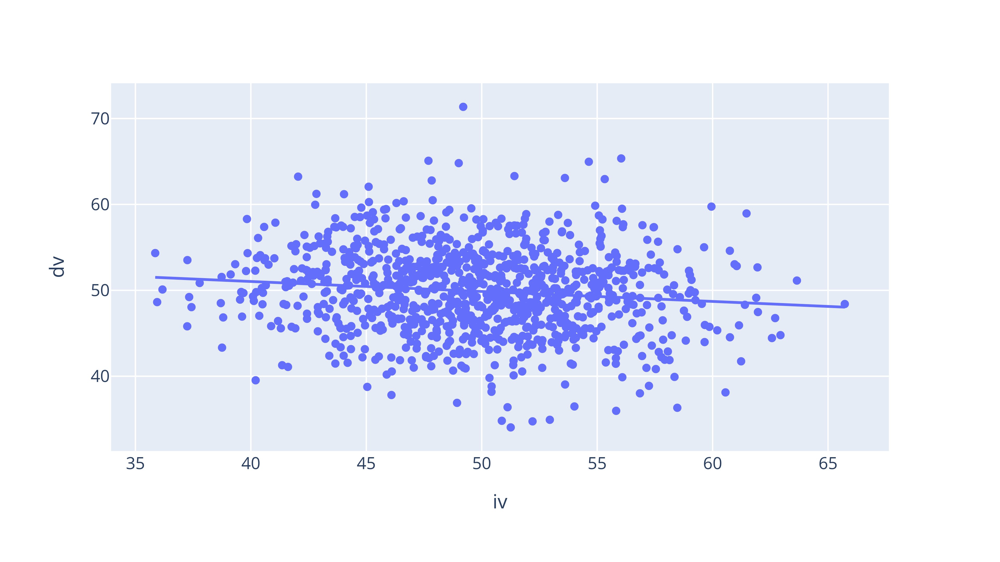

In [81]:
fig_random_data = px.scatter(
    df_list[878], x = 'iv', y = 'dv', trendline = 'ols')
wadi(fig_random_data, 'Charts/random_significant_relationship',
    display_type = display_type)

In [82]:
smf.ols(formula = "dv ~ iv", data = df_list[878]).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     dv   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     13.60
Date:                Tue, 18 Feb 2025   Prob (F-statistic):           0.000239
Time:                        23:52:32   Log-Likelihood:                -3006.0
No. Observations:                1000   AIC:                             6016.
Df Residuals:                     998   BIC:                             6026.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     55.6732      1.573     35.387      0.000      52.586      58.760
iv            -0.1161      0.031     -3.687      0.000      -0.178      -0.054
==============================================================================
Omnibus:                        8.546   Durbin-Watson:                   1.942
Prob(Omnibus):                  0.014   Jarque-Bera (JB):               11.318
Skew:                           0.079   Prob(JB):                      0.00349
Kurtosis:                       3.497   Cond. No.                         508.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [83]:
test_count = list(range(1, 51))
t1_error_odds = [1 - 0.95**test_num for test_num in test_count]

By the time you have completed 14 tests, your odds of making a type I error have risen above 50%:

In [84]:
100*(1-0.95**14)

51.23250208844705

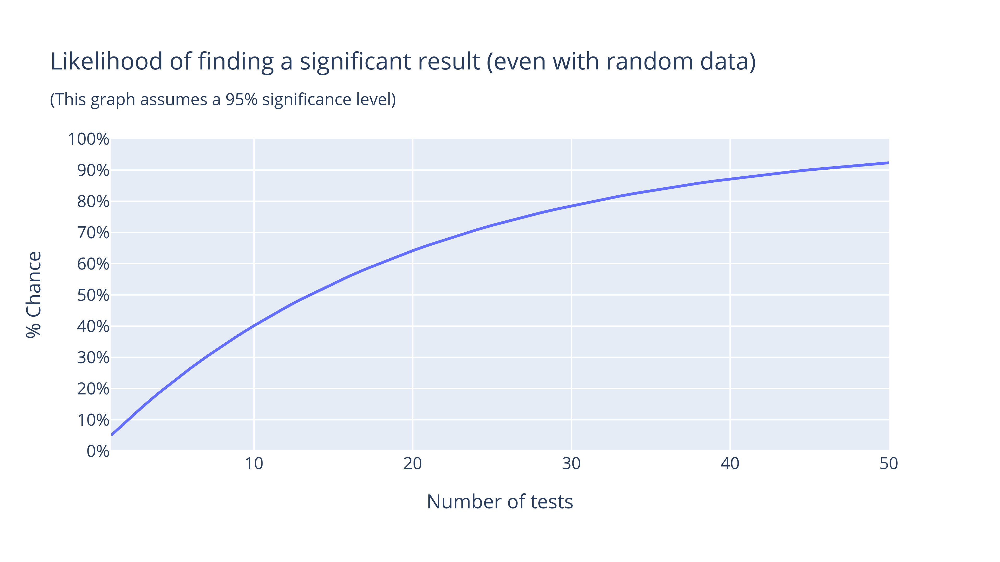

In [85]:
fig_t1_error = px.line(x = test_count, y = t1_error_odds, title = 'Likelihood of \
finding a significant result (even with random data)<br><sub>\
(This graph assumes a 95% significance level)').update_layout(
    yaxis_tickformat = '.0%', xaxis_title = 'Number of tests',
yaxis_title = '% Chance', yaxis_dtick = 0.1, yaxis_range = [0, 1])
# yaxis_dtick allows us to specify the spacing in between ticks;
# yaxis_range lets us determine the lower and upper boundaries of our chart.
# For more on these two options,
# see https://plotly.com/python/reference/layout/yaxis/ . 
wadi(fig_t1_error, 't1_error_odds', display_type=display_type)